## More memory

Users who have purchased one of Colab's paid plans have access to high-memory VMs when they are available.



You can see how much memory you have available at any time by running the following code cell. If the execution result of running the code cell below is "Not using a high-RAM runtime", then you can enable a high-RAM runtime via `Runtime > Change runtime type` in the menu. Then select High-RAM in the Runtime shape dropdown. After, re-execute the code cell.


Referrences:
1. https://www.linkedin.com/advice/1/what-best-practices-feature-engineering-clustering-npiuc


In [1]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 17.1 gigabytes of available RAM

Not using a high-RAM runtime


In [2]:
! pip install yellowbrick scikit-learn

In [3]:
import scipy.cluster.hierarchy as hca
import pandas as pd
import numpy as np
from pylab import *
from matplotlib import pyplot
%matplotlib inline
np.set_printoptions(suppress=True)
from sklearn import cluster
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn import metrics
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import calinski_harabasz_score

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)


In [5]:
#@ from google.colab import drive
# drive.mount('/content/drive')

# Step 1: Data Preparation

In [6]:
# Load the CSV file
data = pd.read_csv('Socio-hpms.csv')
data.head(10)

C:\Users\tadnan\AppData\Local\Temp\ipykernel_14140\1735369441.py:2: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('Socio-hpms.csv')


,Unnamed: 0,AADT_mean,AADT_Single_Unit_mean,Year,AADT_Combination_mean,Dir_Factor_mean,Future_AADT_mean,IRI_mean,Rutting_mean,Cracking_Percent_mean,Thickness_Rigid_mean,Thickness_Flexible_mean,Base_Thickness_mean,Lane_Width_mean,Last_Overlay_Thickness_mean,F_System_mode,Urban_Code_mode,Through_Lanes_mode,Surface_Type_mode,Base_Type_mode,County_Code_mode,State_Code_mode,Year_Last_Improv_mode,Year_Last_Construction_mode,RHU_AV,RHU_AV_MN,RHU_AV_MX,ALBEDO_AVG,CLD_CVR_AV,EMISSIVITY,EMIS_AVG,PER_SUN_AV,SW_SF_AVG,SW_SF_STDV,SW_SURFACE,SW_TOA,DAYS_A_32C,DAYS_BL_0C,FRZ_IDX,FRZ_THAW,SOIL_TL1AV,SOIL_TL2AV,TEMP_AVG,TEMP_MAX,TEMP_MIN,AVG_WND_VEL_AV,AVG_WND_VEL_MX,PRECIPITATION,EVAPORATION,hzdepb_r_mean,sieveno4_r_mean,sieveno10_r_mean,sieveno40_r_mean,sieveno200_r_mean,sandtotal_r_mean,sandfine_r_mean,silttotal_r_mean,claytotal_r_mean,ll_r_mean,pi_r_mean,FIPS_CODE,GEO_ID,FIPS_Code,County,Total Population,Male,Female,Median Age,Median Ages for Men,Median Ages for Women,Perc_Male,Perc_FeMale,Population 16 years and over,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Total Households,Mean income Household (dollars),Total Population_RACE,White Alone,Black or African American alone,Asian alone,Some other race alone,Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone
0,0,1395.0,156.0,2017,54.0,59.0,1590.0,82.0,0.000000,0.0,9.030256,6.000000,15.0,12.0,2.000000,5,99999.0,2,6,2,73,55,1998.0,1993.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
1,1,88.0,34.0,2017,34.0,58.9,89.0,177.0,0.000000,0.0,9.030256,6.000000,15.0,12.0,2.000000,4,93025.0,2,2,2,73,55,2012.0,2012.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
2,2,415.0,165.0,2017,165.0,59.0,420.0,46.0,0.000000,0.0,9.030256,6.000000,15.0,11.0,2.000000,5,99999.0,2,2,2,73,55,2004.0,2004.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
3,3,18721.0,2067.0,2017,711.0,59.0,18758.0,107.0,0.000000,0.0,8.000000,6.000000,15.0,12.0,2.000000,5,99999.0,2,7,2,73,55,1998.0,1998.0,78.5,29.2,119.2,0.2,0.5,8639.6,1.0,46.4,127617.4,63117.0,1531408.2,2691043.0,1.9,170.5,1081.5,80.3,6.7,6.5,5.6,31.5,-31.1,3.0,11.3,1089.7,773.3,57.400000,88.900000,85.300000,70.500000,49.100000,54.800000,18.300000,34.300000,10.900000,23.000000,4.900000,55073,0500000US55073,55073,"Marathon County, Wisconsin",135732.0,68099.0,67633.0,40.5,39.5,41.6,50.171662,49.828338,108237.0,66.0,0.9,55084.0,77209.0,135732.0,122343.0,1433.0,8034.0,1575.0,90.135709,1.055757,5.919017,1.160375
4,4,4541.0,390.0,2017,123.0,59.0,6560.0,138.0,0.100000,2.0,8.000000,4.400000,15.0,12.0,2.000000,4,45910.0,2,7,2,63,55,1989.0,2001.0,75.9,25.3,118.0,0.2,0.5,8622.2,1.0,49.8,131215.5,62008.3,1574585.3

In [7]:
data.columns

Index(['Unnamed: 0', 'AADT_mean', 'AADT_Single_Unit_mean', 'Year',
       'AADT_Combination_mean', 'Dir_Factor_mean', 'Future_AADT_mean',
       'IRI_mean', 'Rutting_mean', 'Cracking_Percent_mean',
       'Thickness_Rigid_mean', 'Thickness_Flexible_mean',
       'Base_Thickness_mean', 'Lane_Width_mean', 'Last_Overlay_Thickness_mean',
       'F_System_mode', 'Urban_Code_mode', 'Through_Lanes_mode',
       'Surface_Type_mode', 'Base_Type_mode', 'County_Code_mode',
       'State_Code_mode', 'Year_Last_Improv_mode',
       'Year_Last_Construction_mode', 'RHU_AV', 'RHU_AV_MN', 'RHU_AV_MX',
       'ALBEDO_AVG', 'CLD_CVR_AV', 'EMISSIVITY', 'EMIS_AVG', 'PER_SUN_AV',
       'SW_SF_AVG', 'SW_SF_STDV', 'SW_SURFACE', 'SW_TOA', 'DAYS_A_32C',
       'DAYS_BL_0C', 'FRZ_IDX', 'FRZ_THAW', 'SOIL_TL1AV', 'SOIL_TL2AV',
       'TEMP_AVG', 'TEMP_MAX', 'TEMP_MIN', 'AVG_WND_VEL_AV', 'AVG_WND_VEL_MX',
       'PRECIPITATION', 'EVAPORATION', 'hzdepb_r_mean', 'sieveno4_r_mean',
       'sieveno10_r_mean', 'sieveno

Here,
1. 'RHU_AV' - Annual average daily average relative humidity,
2. 'RHU_AV_MN' - Annual average daily minimum relative humidity ,
3. 'RHU_AV_MX' - Annual average daily maximum relative humidity ,
4. 'ALBEDO_AVG' - Annual average surface albedo,
5. 'CLD_CVR_AV' - Annual average cloud cover ,
6. 'EMISSIVITY' - Annual average surface emissivity,
7. 'EMIS_AVG', - Annual average surface emissivity,
8. 'PER_SUN_AV', - Annual average sunshine fraction,
9. 'SW_SF_AVG', - Annual average downward net surface shortwave flux
10. 'SW_SF_STDV',
11. 'SW_SURFACE',
12. 'SW_TOA', - Annual average top of atmosphere net downward shortwave flux
13. 'DAYS_A_32C',- Annual number of days with temperature above 32◦C
14. 'DAYS_BL_0C', - Average annual number of days with temperature below 0◦C
15. 'FRZ_IDX', - Annual average freezing index
16. 'FRZ_THAW', - Average number of annual freeze–thaw cycles
17. 'SOIL_TL1AV', - Annual average soil temperature (0 to 100 mm)
18. 'SOIL_TL2AV', - Annual average soil temperature (100 to 400 mm)
19. 'TEMP_AVG', - Annual average daily average temperature
20. 'TEMP_MAX', - Annual average daily maximum temperature
21. 'TEMP_MIN', - Annual average daily minimum temperature
22. 'AVG_WND_VEL_AV', - Annual average daily average wind speed, 2 m above ground surface
23. 'AVG_WND_VEL_MX', - Annual average daily maximum wind speed, 2 m above ground surface
24.  'PRECIPITATION',
25.  'EVAPORATION',

26.'hzdepb_r_mean', - Soil horizon/strata depth,
27. 'sieveno4_r_mean', - Percent passing No. 4 sieve size
28. 'sieveno10_r_mean', - Percent passing No. 10 sieve size
29. 'sieveno40_r_mean',- Percent passing No. 40 sieve size
30. 'sieveno200_r_mean',
31. 'sandtotal_r_mean',
32. 'sandfine_r_mean',
33.  'silttotal_r_mean', - Percent silt fraction
35. 'claytotal_r_mean',-  Percent clay fraction
36. 'll_r_mean', - Soil liquid limit
38. 'pi_r_mean', - Soil plasticity index

39. 'DAYS_BL_0C' - Average annual number of days with temperature below 0◦C

In [8]:
## dropping redunanant columns
data.drop(['Unnamed: 0', 'AADT_Single_Unit_mean','AADT_Combination_mean', 'Dir_Factor_mean', 'Thickness_Rigid_mean', 'Thickness_Flexible_mean',
       'Base_Thickness_mean', 'Last_Overlay_Thickness_mean', 'Through_Lanes_mode', 'Base_Type_mode', 'County_Code_mode',
       'State_Code_mode', 'Year_Last_Improv_mode',
        'RHU_AV_MN', 'RHU_AV_MX',
       'ALBEDO_AVG', 'EMISSIVITY',  'Male', 'Female', 'Total Population_RACE',
       'White Alone', 'Black or African American alone', 'Asian alone',
       'Some other race alone'], axis=1, inplace=True)

## percentage is uunder consideration, therefore just numbers were removed. Also, Total population and Total population Race are the same,

## percentages of race were calculated with respect to the Total population Race because the white, asian rows had Nan values and were filled with mean.

In [9]:
data.shape

(65201, 62)

In [10]:
## Convert all columns to numeric
data.columns

Index(['AADT_mean', 'Year', 'Future_AADT_mean', 'IRI_mean', 'Rutting_mean',
       'Cracking_Percent_mean', 'Lane_Width_mean', 'F_System_mode',
       'Urban_Code_mode', 'Surface_Type_mode', 'Year_Last_Construction_mode',
       'RHU_AV', 'CLD_CVR_AV', 'EMIS_AVG', 'PER_SUN_AV', 'SW_SF_AVG',
       'SW_SF_STDV', 'SW_SURFACE', 'SW_TOA', 'DAYS_A_32C', 'DAYS_BL_0C',
       'FRZ_IDX', 'FRZ_THAW', 'SOIL_TL1AV', 'SOIL_TL2AV', 'TEMP_AVG',
       'TEMP_MAX', 'TEMP_MIN', 'AVG_WND_VEL_AV', 'AVG_WND_VEL_MX',
       'PRECIPITATION', 'EVAPORATION', 'hzdepb_r_mean', 'sieveno4_r_mean',
       'sieveno10_r_mean', 'sieveno40_r_mean', 'sieveno200_r_mean',
       'sandtotal_r_mean', 'sandfine_r_mean', 'silttotal_r_mean',
       'claytotal_r_mean', 'll_r_mean', 'pi_r_mean', 'FIPS_CODE', 'GEO_ID',
       'FIPS_Code', 'County', 'Total Population', 'Median Age',
       'Median Ages for Men', 'Median Ages for Women', 'Perc_Male',
       'Perc_FeMale', 'Population 16 years and over',
       'Employment Rate on 

In [11]:
print(data.shape)
data.dtypes

(65201, 62)


AADT_mean                                            float64
Year                                                   int64
Future_AADT_mean                                     float64
IRI_mean                                             float64
Rutting_mean                                         float64
Cracking_Percent_mean                                float64
Lane_Width_mean                                      float64
F_System_mode                                          int64
Urban_Code_mode                                      float64
Surface_Type_mode                                      int64
Year_Last_Construction_mode                           object
RHU_AV                                               float64
CLD_CVR_AV                                           float64
EMIS_AVG                                             float64
PER_SUN_AV                                           float64
SW_SF_AVG                                            float64
SW_SF_STDV              

In [12]:
#count cells percolumns
# print(data.count())

In [13]:
# notice there are null
data.isnull().any()

AADT_mean                                            False
Year                                                 False
Future_AADT_mean                                     False
IRI_mean                                             False
Rutting_mean                                         False
Cracking_Percent_mean                                False
Lane_Width_mean                                      False
F_System_mode                                        False
Urban_Code_mode                                      False
Surface_Type_mode                                    False
Year_Last_Construction_mode                          False
RHU_AV                                               False
CLD_CVR_AV                                           False
EMIS_AVG                                             False
PER_SUN_AV                                           False
SW_SF_AVG                                            False
SW_SF_STDV                                           Fal

In [14]:
data.drop(['Year_Last_Construction_mode', 'GEO_ID', 'County'], axis=1, inplace=True)

In [15]:
data.shape

(65201, 59)

## Feature Engineering

1. Find correlation between the columns then you can remove the very correlated columns as needed.  (use pearson correlation).

2. Detect the oultiers with data.secrbie, boxplot and other methods if needed.

3. Scale the data

4. Check the data with pairwise distribution

Pearson correlations
Understand from
1. https://www.geeksforgeeks.org/exploring-correlation-in-python/
2. https://medium.com/@chandradip93/all-about-feature-selec-e6e88e8ccd46

In [16]:
## calculate correlations in different times.

def calculate_corr(df):
  data_corr_ = df.corr(method = 'pearson') ## import pandas if needed.
  return data_corr_

## This function will return that which columns are correlated with a specific thresholds.
def calculate_corr_columns (df, threshold_value):
  data_corr_ = df.corr(method = 'pearson') ## import pandas if needed.

  find_corr_columns = []

  ## now calculate that # 'f' now contains the indices of rows where any off-diagonal value is greater than a specific values.
  for index, row in data_corr_.iterrows():  # Iterate over rows
    # Check if any value in the row (excluding the diagonal) is greater than 0.90
    # Diagonal values can be excluded by masking or other logic, depending on the structure of your DataFrame
    # Assuming the correlation matrix is square and indexed similarly to columns:
    value = row[row.index != index] > threshold_value
    if value.any():  # If any value in 'value' is True (excluding diagonal), proceed
        find_corr_columns .append(index)  # Append the row index (label) where the condition is met
  ## This function will return that which columns are correlated with a specific thresholds.

  ## Now check pearson correlation just for seeing the values
  # use heatmap for presenting the correlations
  plt.figure(figsize= (30, 18))
  corre_matrix = sns.heatmap(data_corr_[find_corr_columns], annot=True, linewidth=.5)
  return find_corr_columns, corre_matrix

In [17]:
calculate_corr(data)

,AADT_mean,Year,Future_AADT_mean,IRI_mean,Rutting_mean,Cracking_Percent_mean,Lane_Width_mean,F_System_mode,Urban_Code_mode,Surface_Type_mode,RHU_AV,CLD_CVR_AV,EMIS_AVG,PER_SUN_AV,SW_SF_AVG,SW_SF_STDV,SW_SURFACE,SW_TOA,DAYS_A_32C,DAYS_BL_0C,FRZ_IDX,FRZ_THAW,SOIL_TL1AV,SOIL_TL2AV,TEMP_AVG,TEMP_MAX,TEMP_MIN,AVG_WND_VEL_AV,AVG_WND_VEL_MX,PRECIPITATION,EVAPORATION,hzdepb_r_mean,sieveno4_r_mean,sieveno10_r_mean,sieveno40_r_mean,sieveno200_r_mean,sandtotal_r_mean,sandfine_r_mean,silttotal_r_mean,claytotal_r_mean,ll_r_mean,pi_r_mean,FIPS_CODE,FIPS_Code,Total Population,Median Age,Median Ages for Men,Median Ages for Women,Perc_Male,Perc_FeMale,Population 16 years and over,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Total Households,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone
AADT_mean,1.000000,-0.061643,0.979404,-0.304351,-0.060659,-0.111410,0.093859,-0.586472,-0.073724,0.137590,0.085116,0.054880,0.070330,-0.032448,-0.029033,-0.059900,-0.029033,0.044604,-0.085033,-0.036408,-0.075977,-0.009192,0.031479,0.032070,0.045566,-0.030073,0.049553,-0.051315,-0.035651,0.118487,0.146706,0.012785,-0.012359,-0.017382,-0.029896,-0.068245,0.041646,0.052014,-0.020379,-0.049107,-0.045057,-0.074947,-0.102732,-0.102732,0.157683,0.037023,0.031940,0.037073,-0.130309,0.130309,0.162291,0.133101,-0.065688,0.164851,0.185355,-0.106426,0.156460,0.093204,-0.008749
Year,-0.061643,1.000000,-0.047041,-0.019524,-0.031989,-0.018719,-0.001944,0.051354,-0.028613,-0.087588,-0.051685,-0.051030,-0.694456,0.061001,0.074319,-0.069030,0.074319,0.081387,0.080879,-0.048353,-0.009528,-0.068082,0.078559,0.077482,0.072684,0.041143,0.044738,0.100837,0.088913,-0.078749,-0.036581,0.078453,0.056884,0.062349,0.071494,-0.007888,0.033534,0.053262,-0.086681,0.052485,0.006325,0.091239,0.127205,0.127205,0.022853,-0.009028,0.001733,-0.014527,0.062816,-0.062818,0.024356,-0.012659,0.610129,0.027275,0.210423,-0.119979,-0.005798,-0.035627,0.376849
Future_AADT_mean,0.979404,-0.047041,1.000000,-0.304021,-0.054890,-0.115275,0.095744,-0.582717,-0.079613,0.116946,0.058059,0.032735,0.047679,-0.009880,-0.005818,-0.062916,-0.005818,0.052091,-0.058823,-0.049583,-0.082712,-0.020680,0.043334,0.043937,0.055902,-0.007527,0.059837,-0.044308,-0.029987,0.091947,0.126551,0.011738,-0.006106,-0.008395,-0.021663,-0.064993,0.042654,0.051719,-0.031386,-0.037304,-0.034466,-0.059475,-0.075684,-0.075684,0.152916,0.010763,0.007565,0.009163,-0.111151,0.111152,0.156252,0.139179,-0.065039,0.158015,0.181199,-0.106784,0.144419,0.084983,0.013065
IRI_mean,-0.304351,-0.019524,-0.304021,1.000000,0.151698,0.270455,-0.106591,0.515143,-0.160278,-0.159264,-0.106296,-0.171873,0.014808,0.154296,0.119011,-0.053132,0.119011,0.079050,0.201609,-0.112900,-0.103580,-0.086500,0.112433,0.112381,0.105708,0.194435,0.085982,0.127518,0.100455,-0.093765,-0.057444,0.072597,0.094505,0.096817,0.133815,0.180820,-0.143129,-0.134647,0.047794,0.198620,0.195147,0.213868,0.092604,0.092604,0.125599,-0.199498,-0.193078,-0.200001,-0.002064,0.002063,0.121188,0.050031,0.094024,0.118611,0.018707,-0.215776,0.082235,0.160527,0.061310
Rutting_mean,-0.060659,-0.031989,-0.054890,0.151698,1.000000,0.169072,-0.011063,0.024214,0.063116,-0.029535,0.096071,0.146044,0.039968,-0.156255,-0.154950,0.133684,-0.154950,-0.182877,-0.142786,0.126799,0.141208,0.101452,-0.172431,-0.171526,-0.174691,-0.159389,-0.129286,-0.187010,-0.188251,0.071721,0.001721,-0.106712,-0.087650,-0.096825,-0.126579,-0.051525,0.044257,0.012372,0.031380,-0.121111,-0.082804,-0.122902,0.012778,0.012778,-0.091972,0.064754,0.060804,0.062134,-0.010355,0.010359,-0.092477,-0.038936,-0.030829,-0.088905,-0.048791,0.077212,-0.030783,-0.059546,-0.056815
Cracking_Percent_mean,-0.111410,-0.018719,-0.115275,0.270455,0.169072,1.000000,-0.054251,0.156474,-0.033569,-0.018341,0.008467,-0.060297,0.022537,0.076725,0.058293,-0.082098,0.058293,0.078537,0.025814,-0.059442,-0.083836,-0.028425,

(['AADT_mean',
  'Future_AADT_mean',
  'PER_SUN_AV',
  'SW_SF_AVG',
  'SW_SURFACE',
  'SW_TOA',
  'DAYS_BL_0C',
  'FRZ_THAW',
  'SOIL_TL1AV',
  'SOIL_TL2AV',
  'TEMP_AVG',
  'TEMP_MIN',
  'AVG_WND_VEL_AV',
  'AVG_WND_VEL_MX',
  'sieveno4_r_mean',
  'sieveno10_r_mean',
  'sieveno40_r_mean',
  'sandtotal_r_mean',
  'sandfine_r_mean',
  'claytotal_r_mean',
  'pi_r_mean',
  'FIPS_CODE',
  'FIPS_Code',
  'Total Population',
  'Median Age',
  'Median Ages for Men',
  'Median Ages for Women',
  'Population 16 years and over',
  'Total Households'],
 <Axes: >)

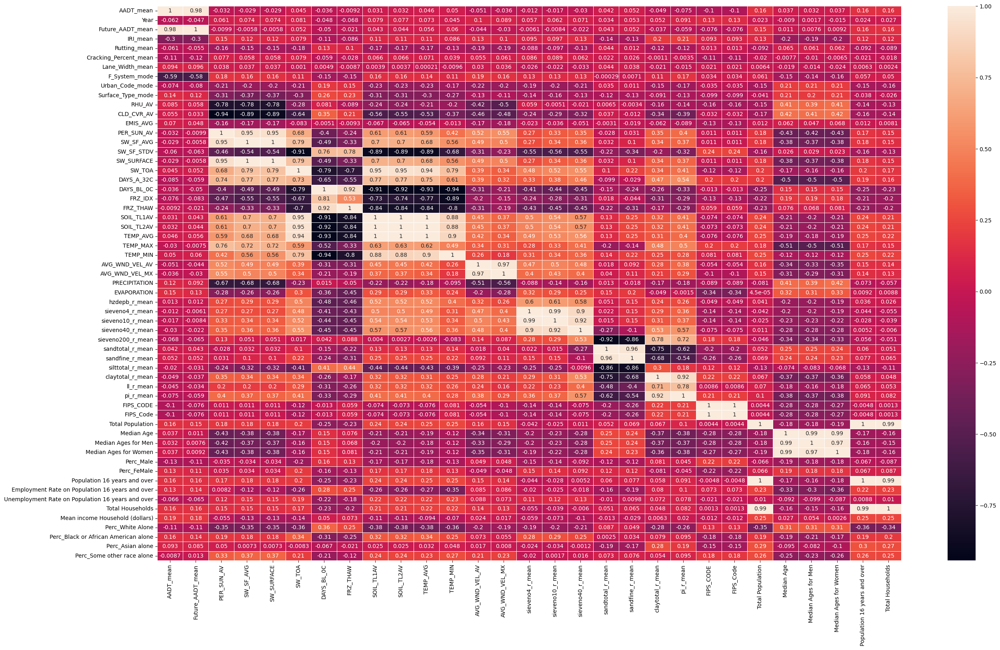

In [18]:
calculate_corr_columns (data, 0.90)

In [19]:
to_drop = [ 'Future_AADT_mean', 'PER_SUN_AV','SW_SURFACE','SW_TOA','FRZ_THAW', 'SOIL_TL1AV',
 'SOIL_TL2AV','TEMP_MIN','AVG_WND_VEL_AV',  'sieveno4_r_mean',
 'sieveno10_r_mean',  'sandfine_r_mean', 'pi_r_mean','Median Ages for Men', 'Median Ages for Women','Population 16 years and over', 'Total Households', 'FIPS_Code']

data.drop(to_drop, axis=1, inplace=True)

In [20]:
data.shape

(65201, 41)

In [21]:
data.columns

Index(['AADT_mean', 'Year', 'IRI_mean', 'Rutting_mean',
       'Cracking_Percent_mean', 'Lane_Width_mean', 'F_System_mode',
       'Urban_Code_mode', 'Surface_Type_mode', 'RHU_AV', 'CLD_CVR_AV',
       'EMIS_AVG', 'SW_SF_AVG', 'SW_SF_STDV', 'DAYS_A_32C', 'DAYS_BL_0C',
       'FRZ_IDX', 'TEMP_AVG', 'TEMP_MAX', 'AVG_WND_VEL_MX', 'PRECIPITATION',
       'EVAPORATION', 'hzdepb_r_mean', 'sieveno40_r_mean', 'sieveno200_r_mean',
       'sandtotal_r_mean', 'silttotal_r_mean', 'claytotal_r_mean', 'll_r_mean',
       'FIPS_CODE', 'Total Population', 'Median Age', 'Perc_Male',
       'Perc_FeMale', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone'],
      dtype='object')

So, featured variables are found. But for this research some less prioritized columns are here. so exclude them.
'hzdepb_r_mean', 'sieveno40_r_mean', 'sieveno200_r_mean',
       'sandtotal_r_mean', 'silttotal_r_mean', 'claytotal_r_mean', 'll_r_mean',

'CLD_CVR_AV' - Annual average cloud cover ,
'SW_SF_STDV'


In [22]:
## data['FIPS_CODE'] = data['FIPS_CODE'].astype('category')  # Converts to categorical
## data['Urban_Code_mode'] = data['Urban_Code_mode'].astype('category')  # Converts to categorical
data.columns.get_loc('FIPS_CODE')

29

In [23]:
data.columns.get_loc('Urban_Code_mode')

7

In [24]:
## we need to add these columns after the clustering at last

In [25]:
to_drop_2 = ['Rutting_mean','Cracking_Percent_mean','F_System_mode', 'Surface_Type_mode', 
       'Lane_Width_mean','EMIS_AVG','TEMP_MAX','FRZ_IDX','CLD_CVR_AV','SW_SF_AVG','SW_SF_STDV', 'DAYS_A_32C','DAYS_BL_0C','AVG_WND_VEL_MX','EVAPORATION','hzdepb_r_mean', 'sieveno40_r_mean', 'sieveno200_r_mean', 'sandtotal_r_mean', 'silttotal_r_mean', 'claytotal_r_mean', 'll_r_mean', 'Perc_Male',
      'Perc_FeMale']

data.drop(to_drop_2 , axis=1, inplace=True)

In [26]:
data.shape

(65201, 17)

In [27]:
data.columns

Index(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone'],
      dtype='object')

# Select Dataset for trend Analysis

## Filter dataset year by Year

In [28]:
df_2017 = data[data['Year'] == 2017]
df_2018 = data[data['Year'] == 2018]
df_2019 = data[data['Year'] == 2019]
df_2020 = data[data['Year'] == 2020]

print(df_2017.shape)
print(df_2018.shape)
print(df_2019.shape)
print(df_2020.shape)

(14584, 17)
(9438, 17)
(20470, 17)
(20709, 17)


# Outlier Detection

Read this:
1. https://hersanyagci.medium.com/detecting-and-handling-outliers-with-pandas-7adbfcd5cad8

2. https://towardsdatascience.com/5-ways-to-detect-outliers-that-every-data-scientist-should-know-python-code-70a54335a623

3. https://www.analyticsvidhya.com/blog/2021/05/detecting-and-treating-outliers-treating-the-odd-one-out/#:~:text=Step%203%3A%20Mean%2FMedian%20Imputation,outliers%20with%20the%20median%20value.

4. https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

First 2017

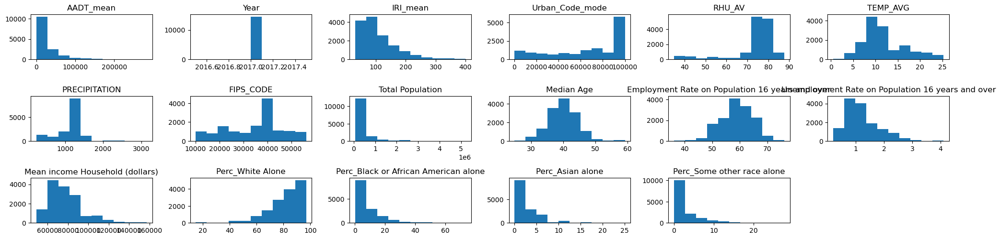

In [29]:
plt.figure(figsize=(20, 10))
plt.subplots_adjust(hspace=0.5)
for i, feature in enumerate(df_2017.columns):
    ax = plt.subplot(6, 6, i + 1) #  you can have up to 6*6 = 36 individual subplots in total
    ax.hist(df_2017[feature])
    ax.set_title(feature)
plt.tight_layout()

In [30]:
## understand the distribution of data and indentifying the outliers
df_2017.describe()

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone
count,14584.000000,14584.0,14584.000000,14584.000000,14584.000000,14584.000000,14584.000000,14584.000000,1.458400e+04,14584.000000,14584.000000,14584.000000,14584.000000,14584.000000,14584.000000,14584.000000,14584.000000
mean,24998.454971,2017.0,106.585457,68140.552523,73.546470,11.799196,1163.282306,35180.185477,3.861967e+05,40.047326,58.787659,1.226880,78094.589276,81.526753,8.672213,2.921326,2.764812
std,30775.253523,0.0,59.552492,33112.594164,10.384962,4.837129,369.688874,11644.369015,5.050922e+05,4.594565,5.774027,0.617968,16983.889610,12.696866,9.723129,3.047822,3.543281
min,15.000000,2017.0,30.000000,199.000000,34.900000,0.500000,240.000000,10001.000000,6.279200e+04,24.800000,36.100000,0.200000,48948.000000,14.551293,0.079000,0.000000,0.000000
25%,5579.750000,2017.0,63.500000,43912.000000,73.800000,8.700000,1069.600000,24021.000000,1.234570e+05,37.300000,55.000000,0.800000,65926.000000,74.918156,2.151879,0.963541,0.526268
50%,14984.500000,2017.0,90.000000,75718.000000,76.400000,10.500000,1280.200000,39089.000000,2.179370e+05,40.000000,58.900000,1.100000,75655.000000,84.285217,5.008205,1.880850,1.431887
75%,31220.500000,2017.0,133.000000,99999.000000,78.100000,14.400000,1362.000000,42107.000000,4.237250e+05,42.900000,62.600000,1.500000,85710.000000,91.500743,12.642186,3.832720,3.512307
max,283614.000000,2017.0,400.000000,99999.000000,87.600000,25.300000,3145.300000,56025.000000,5.211263e+06,59.200000,76.100000,4.106673,157210.000000,96.816372,73.291523,25.072081,27.630888


# Read
source: https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b

Using Pairplots for better understanding of the data points distribution

# Step 2: Pre-clustering using K-Means

Understand KMeans Clustering from here:
https://github.com/alexandrehsd/Cluster-Analysis/blob/master/Cluster%20Analysis.ipynb

See this vidoe for better understanding: https://www.youtube.com/watch?v=4b5d3muPQmA

 The K-means algorithm performs the following steps:

1. Choose the number (K) of clusters
2. Specify the cluster seeds (Define the initial position of the centroids)
Here, you can create a range of cluster numbers and use loop to find the best answers.
3. Assign each point to a centroid based on its proximity (if the centroid
 is the nearest centroid to the point, then assign to , do this for all points)
4. Adjust the centroid (recalculate the position of each centroid based in the points assigned to them)
5. Repeat step 3 and 4, until achieving a stop criterion
6. After achieve a stop criteria, end execution.

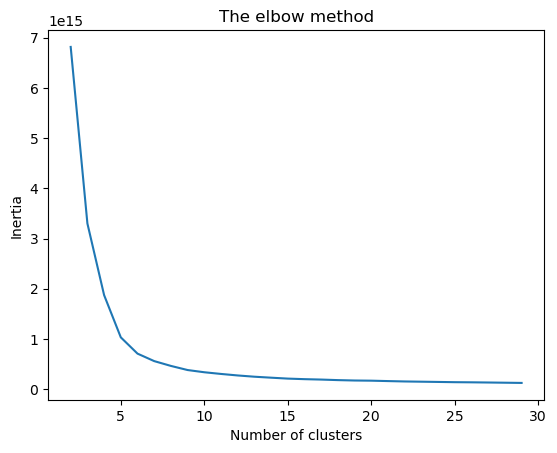

In [31]:
# Finding the optimal number of clusters for K-Means using Elbow Method
# source: https://medium.com/mlearning-ai/elbow-method-vs-silhouette-co-efficient-in-determining-the-number-of-clusters-33baff2fbeee

# step-1: initialize some number of clusters

inertia = []

for n_clusters in range(2, 30):
  kmeans_model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)
  kmeans_model.fit(data)
  inertia.append(kmeans_model.inertia_)

# Plotting the elbow curve
plt.plot(range(2, 30), inertia)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

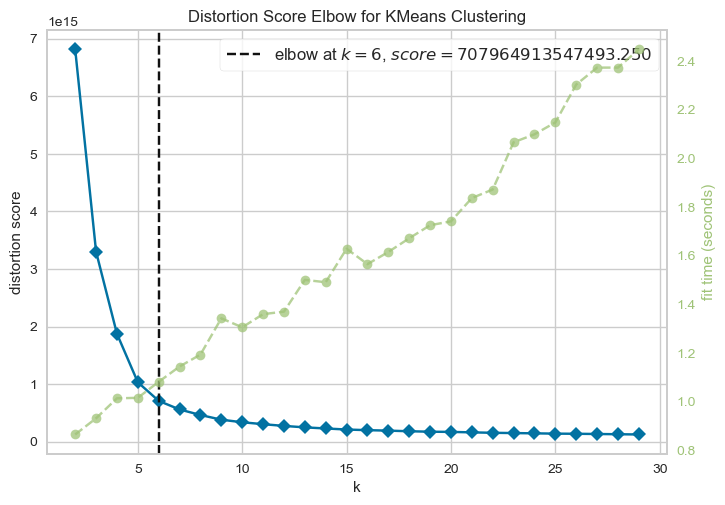

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [32]:
## source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad 

# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(data)        # Fit data to visualizer
visualizer.show()   

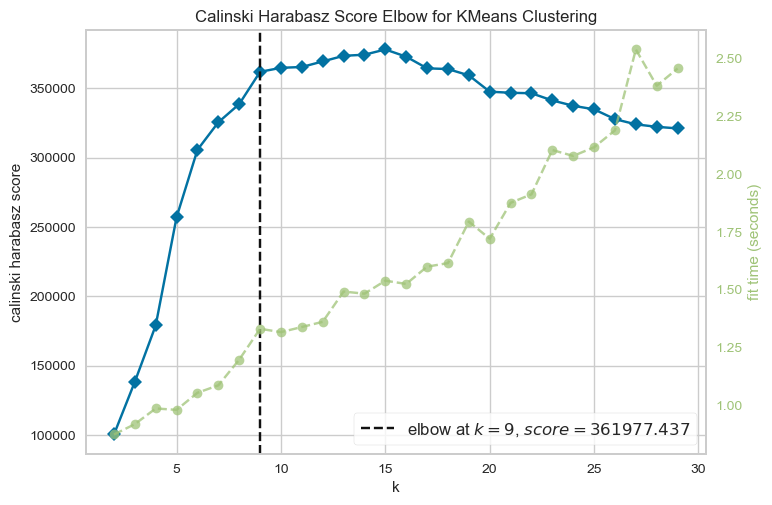

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [33]:
##  check optimal clusters for calinski_harabasz 
## source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad 

from yellowbrick.cluster import KElbowVisualizer
model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), metric='calinski_harabasz', timings= True)
visualizer.fit(data)        # Fit the data to the visualizer
visualizer.show() 

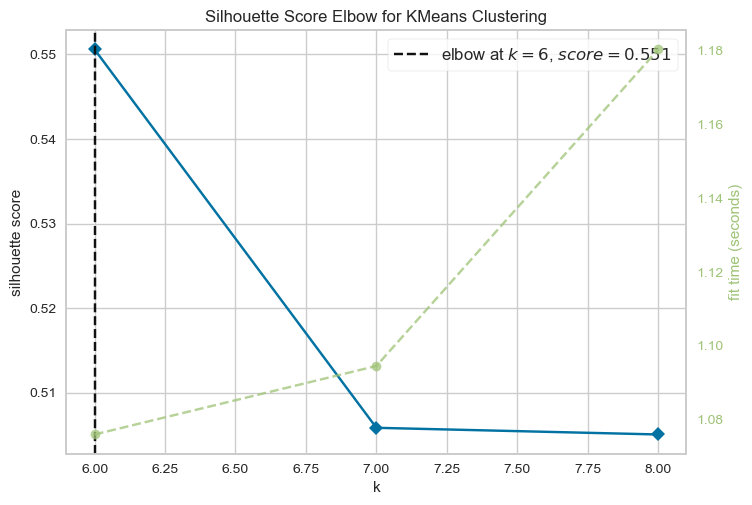

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [34]:
### Silhouette Score for K means
### source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad 

### from yellowbrick.cluster import KElbowVisualizer
model = KMeans(n_clusters=n_clusters, init='k-means++',max_iter=300, n_init=10, random_state=42)

### k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(6,9),metric='silhouette', timings= True)
visualizer.fit(data)        # Fit the data to the visualizer
visualizer.show()   

### guide source: https://www.kaggle.com/code/dhanyajothimani/basic-visualization-and-clustering-in-python


In [35]:
# Applying K-Means with the optimal number of clusters
kmeans = KMeans(n_clusters=6, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

cluster_labels = kmeans.fit_predict(data)

In [36]:
kmeans.n_features_in_

17

In [37]:
kmeans.feature_names_in_

array(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone'], dtype=object)

In [38]:
kmeans.get_params

<bound method BaseEstimator.get_params of KMeans(n_clusters=6, n_init=10, random_state=42)>

In [39]:
silhouette_avg = silhouette_score(data, cluster_labels)
print(f"The average silhouette score: {silhouette_avg}")

The average silhouette score: 0.5505864103904413


In [40]:
kmeans_data_cluster = pd.DataFrame(cluster_labels)
kmeans_data_cluster.head(100)

,0
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,3


In [41]:
data.insert((data.shape[1]),'kmeans_data_cluster',kmeans_data_cluster)

In [42]:
data['kmeans_data_cluster'].count()

65201

In [43]:
data.head(100)

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster
0,1395.0,2017,82.0,99999.0,78.5,5.6,1089.7,55073,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,0
1,88.0,2017,177.0,93025.0,78.5,5.6,1089.7,55073,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,0
2,415.0,2017,46.0,99999.0,78.5,5.6,1089.7,55073,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,0
3,18721.0,2017,107.0,99999.0,78.5,5.6,1089.7,55073,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,0
4,4541.0,2017,138.0,45910.0,75.9,7.4,986.4,55063,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537,0
5,40768.0,2017,99.0,45910.0,75.9,7.4,986.4,55063,118274.0,36.6,65.1,0.8,75287.0,91.111318,1.816122,4.513249,0.396537,0
6,40961.0,2017,64.0,47719.0,76.2,8.5,1068.6,26037,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359,0
7,25756.0,2017,114.7,47719.0,76.2,8.5,1068.6,26037,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359,0
8,7826.0,2017,96.0,99999.0,76.8,7.8,1006.0,26073,71063.0,28.1,53.8,1.8,59829.0,88.225940,2.316255,1.778703,0.451712,0
9,2807.0,2017,180.9,40429.0,77.0,20.3,1196.0,48201,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197,3


In [44]:
data.columns.get_loc("Unemployment Rate on Population 16 years and over")

11

## we should check correlation in cluster profiles only

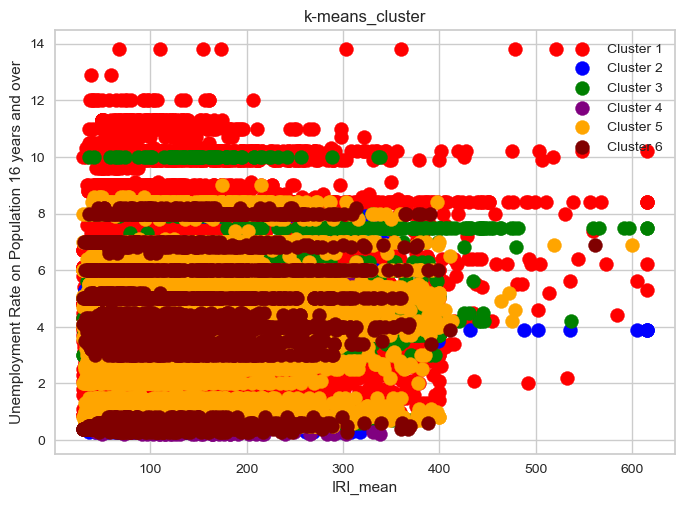

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df_2017 is your DataFrame
# Let's find the column names for positions 3 and 14
x_axis_name = data.columns[2]
y_axis_name = data.columns[11]

X = data.iloc[:, [2,11]].values

plt.scatter(X[cluster_labels==0, 0], X[cluster_labels==0, 1], s=100, c='red', label ='Cluster 1')
plt.scatter(X[cluster_labels==1, 0], X[cluster_labels==1, 1], s=100, c='blue', label ='Cluster 2')
plt.scatter(X[cluster_labels==2, 0], X[cluster_labels==2, 1], s=100, c='green', label ='Cluster 3')
plt.scatter(X[cluster_labels==3, 0], X[cluster_labels==3, 1], s=100, c='purple', label ='Cluster 4')
plt.scatter(X[cluster_labels==4, 0], X[cluster_labels==4, 1], s=100, c='orange', label ='Cluster 5')
plt.scatter(X[cluster_labels==5, 0], X[cluster_labels==5, 1], s=100, c='maroon', label ='Cluster 6')


#plt.scatter(X[y_hc==5, 0], X[y_hc==5, 1], s=100, c='yellow', label ='Cluster 6')

plt.title('k-means_cluster')
plt.legend()

# Set the labels to the actual column names
plt.xlabel(x_axis_name)
plt.ylabel(y_axis_name)
plt.savefig('k-means_clusters.png')
plt.show()


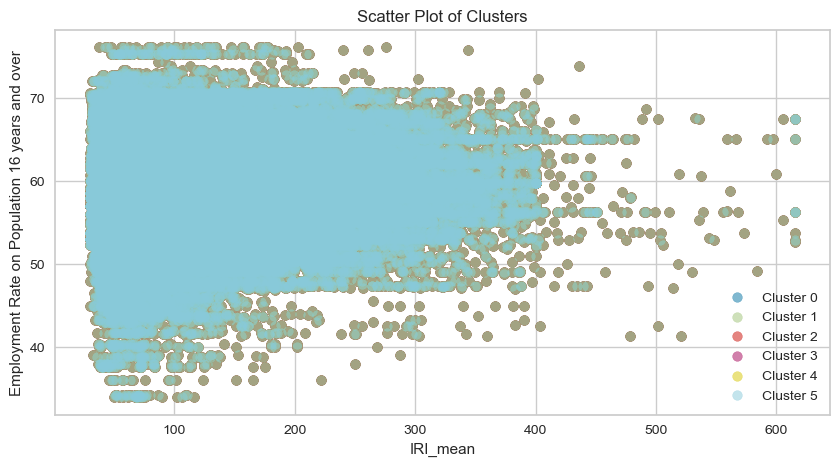

In [46]:
column_x = data.columns[2]  # Replace with your actual column name or index
column_y = data.columns[10]  # Replace with your actual column name or index
plt.figure(figsize=(10, 5))

# Iterate through each cluster to plot
for cluster_id in range(6):  # Replace 'number_of_clusters' with the actual number
    cluster_data = data[data['kmeans_data_cluster'] == cluster_id]
    plt.scatter(data[column_x], data[column_y], alpha=0.5, label=f'Cluster {cluster_id}')

# Add the legend, title, and labels
plt.legend(loc="best")
plt.title('Scatter Plot of Clusters')
plt.xlabel(column_x)
plt.ylabel(column_y)
plt.show()

### Check different cluster profiles 

### Check cluster_1

In [47]:
cluster_1 = data[data['kmeans_data_cluster'] == 3]
print(cluster_1.shape)

# Sorting by 'IRI_mean' in ascending order
X = cluster_1.sort_values(by=['IRI_mean'], ascending=True)
X.head(10)

(235, 18)


,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster
32897,62512.0,2019,41.0,16264.0,75.8,9.4,1081.6,17031,5150233.0,37.2,62.4,5.5,100785.0,56.622215,23.101751,7.681186,9.381731,3
18,18267.0,2017,44.0,40429.0,77.0,20.3,1196.0,48201,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197,3
19,24481.0,2017,46.6,40429.0,77.0,20.3,1196.0,48201,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197,3
25125,24673.0,2019,48.5,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
25124,17979.0,2019,48.7,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
4295,5000.0,2017,50.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3
25122,23500.0,2019,65.8,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
4288,70300.0,2017,73.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3
25044,4265.0,2019,75.0,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
25045,1832.0,2019,75.8,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3


## Now you can basic statsics of each clusters from the cluster centroids. later you can cluster on this center to see the relationsip of clusters. For example, in a cluster hierarchy there 3 clusters, now check the rows of the dataset. From that rows you will see the distribution of the factors. 

In [48]:
centroids = kmeans.cluster_centers_
centroids_ = pd.DataFrame(centroids, columns=data.columns[1:])  # Adjust the index as needed
centroids_.to_csv('centroids_kmeans.csv')

In [49]:
centroids_

,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster
0,16908.430163,2018.652922,112.862589,70512.393590,73.231678,11.913277,1133.382413,35193.879757,1.504176e+05,39.713323,57.879711,3.969555,78184.105237,80.104301,8.593574,2.672904,3.650911
1,27650.510674,2018.678756,146.655428,56274.497409,61.012132,17.632028,909.382331,37413.374093,2.248413e+06,36.614093,62.311554,3.899430,90718.177461,60.724955,14.691914,7.799051,11.053541
2,33156.273716,2018.680573,136.881951,60255.779695,71.128414,14.542586,1096.011560,32182.464271,7.836158e+05,37.908688,60.966859,3.977860,94045.077723,64.161799,12.798243,9.275120,6.516614
3,19349.068085,2018.544681,176.466383,33737.893617,76.642553,17.053191,1161.923404,38916.319149,4.849810e+06,34.797021,63.044255,4.289787,92797.910638,60.093796,20.357398,7.163784,9.299275
4,25665.373140,2018.857544,118.512774,59777.337464,73.870788,13.426713,1154.934354,36859.127550,4.025017e+05,39.207488,60.124201,3.914310,88404.266821,75.570763,10.613386,3.475332,5.507449
5,40867.891465,2019.006674,124.540268,55754.343871,70.715258,15.030538,1059.263372,37334.965578,1.249927e+06,37.100527,62.442606,4.203231,94550.158588,62.593823,15.996670,6.509895,9.628693


In [50]:
centroids_.iloc[0]

Year                                                  16908.430163
IRI_mean                                               2018.652922
Urban_Code_mode                                         112.862589
RHU_AV                                                70512.393590
TEMP_AVG                                                 73.231678
PRECIPITATION                                            11.913277
FIPS_CODE                                              1133.382413
Total Population                                      35193.879757
Median Age                                           150417.606996
Employment Rate on Population 16 years and over          39.713323
Unemployment Rate on Population 16 years and over        57.879711
Mean income Household (dollars)                           3.969555
Perc_White Alone                                      78184.105237
Perc_Black or African American alone                     80.104301
Perc_Asian alone                                          8.59

In [51]:
centroids_.iat[0, 1]  # First row, first column

2018.65292163377

In [52]:
kmeans.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [53]:
# Get the column index of `Mean income Household (dollars)`
centroids_.columns.get_loc('Mean income Household (dollars)')

11

### centroid of Mean Houshold income vs IRI in all clusters  

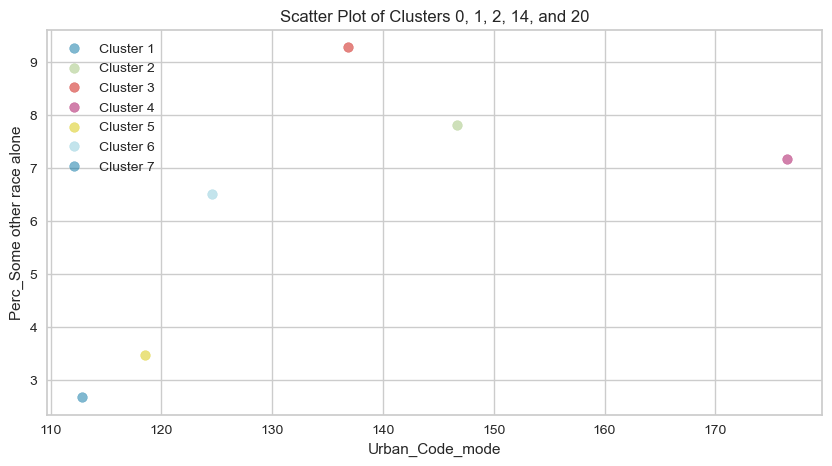

In [54]:
## check how IRI and mean household incomes are related in every clusters

column_x = centroids_.columns[2]  # Replace with your actual column name or index
column_y = centroids_.columns[15]  # Replace with your actual column name or index

# Start a new figure
plt.figure(figsize=(10, 5))

# Filter the dataframe for cluster 0 and plot

cluster_1 = centroids_[centroids_.index== 0]
plt.scatter(cluster_1[column_x], cluster_1[column_y], alpha=0.5, label='Cluster 1')

cluster_2 = centroids_[centroids_.index== 1]
plt.scatter(cluster_2[column_x], cluster_2[column_y], alpha=0.5, label='Cluster 2')

cluster_3 = centroids_[centroids_.index == 2]
plt.scatter(cluster_3[column_x], cluster_3[column_y], alpha=0.5, label='Cluster 3')

cluster_4 = centroids_[centroids_.index == 3]
plt.scatter(cluster_4[column_x], cluster_4[column_y], alpha=0.5, label='Cluster 4')

cluster_5 = centroids_[centroids_.index == 4]
plt.scatter(cluster_5[column_x], cluster_5[column_y], alpha=0.5, label='Cluster 5')

cluster_6 = centroids_[centroids_.index == 5]
plt.scatter(cluster_6[column_x], cluster_6[column_y], alpha=0.5, label='Cluster 6')

cluster_7 = centroids_[centroids_.index == 6]
plt.scatter(cluster_7[column_x], cluster_7[column_y], alpha=0.5, label='Cluster 7')

# Add the legend, title, and labels
plt.legend()
plt.title('Scatter Plot of Clusters 0, 1, 2, 14, and 20')
plt.xlabel(column_x)
plt.ylabel(column_y)
plt.show()

## Check cluster profiles
### if you select df.iloc(0:n) means you will be able to see how different columns are absored in different clusters

### Lets check cluster 4

In [55]:
cluster_4 = data[data['kmeans_data_cluster'] == 3] # count from 0 to 4
print(cluster_4.shape)

(235, 18)


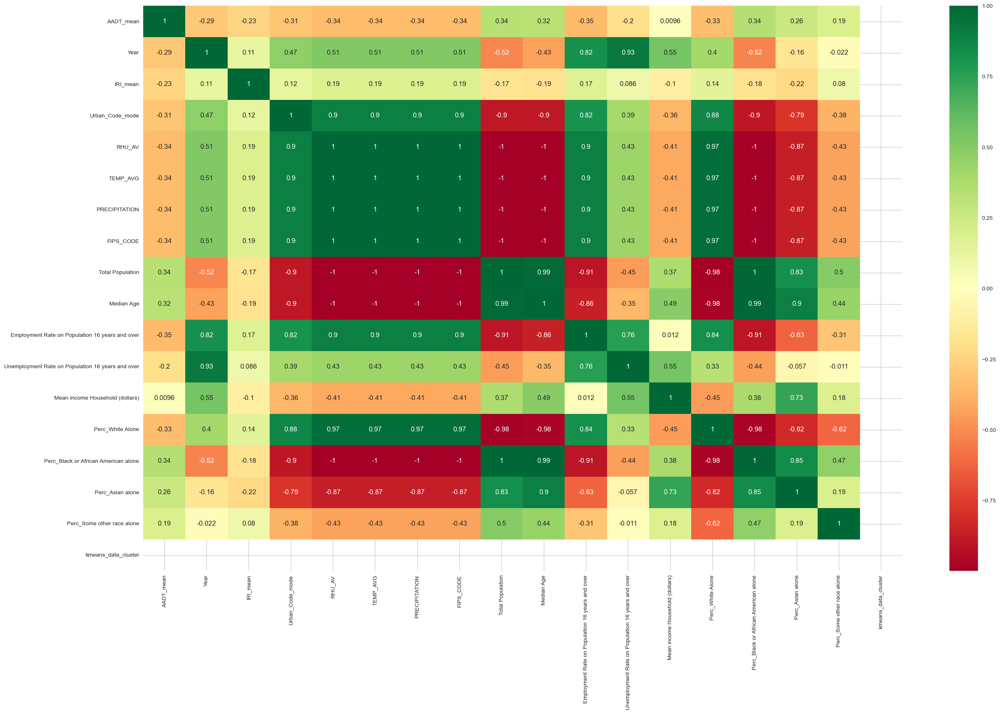

In [56]:
#get correlations of each features in dataset
corrmat = cluster_4.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(30,18))

#plot heat map
g=sns.heatmap(cluster_4[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [57]:
# Sorting by 'IRI_mean' in ascending order
X = cluster_4.sort_values(by=['IRI_mean'], ascending=True)

In [58]:
X.head(100)

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster
32897,62512.0,2019,41.0,16264.0,75.8,9.4,1081.6,17031,5150233.0,37.2,62.4,5.5,100785.0,56.622215,23.101751,7.681186,9.381731,3
18,18267.0,2017,44.0,40429.0,77.0,20.3,1196.0,48201,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197,3
19,24481.0,2017,46.6,40429.0,77.0,20.3,1196.0,48201,4652980.0,33.6,62.6,0.3,86830.0,63.818198,18.918328,7.083375,7.310197,3
25125,24673.0,2019,48.5,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
25124,17979.0,2019,48.7,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
4295,5000.0,2017,50.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3
25122,23500.0,2019,65.8,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
4288,70300.0,2017,73.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3
25044,4265.0,2019,75.0,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3
25045,1832.0,2019,75.8,40429.0,77.0,20.3,1196.0,48201,4713325.0,33.9,63.7,5.2,92488.0,61.436735,19.137191,7.033633,9.268340,3


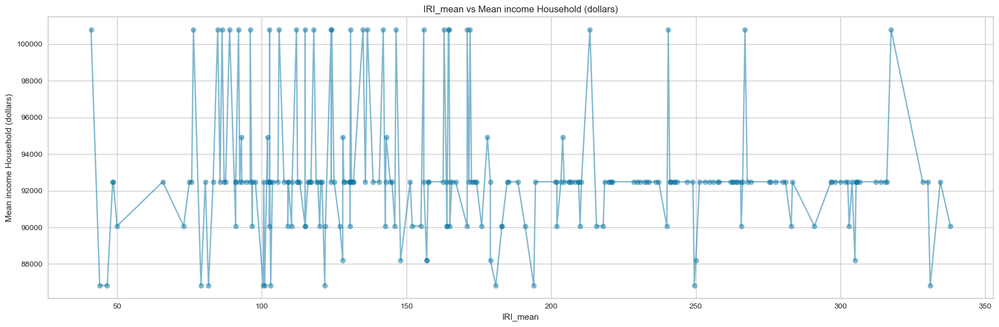

In [59]:
# List of variables to plot against 'IRI_mean'
variables_to_plot = ['Mean income Household (dollars)']

for i, variable in enumerate(variables_to_plot, 1):
    plt.figure(figsize=(18, 6))
    plt.subplot(1, len(variables_to_plot), i)
    plt.plot(X['IRI_mean'], X[variable], marker='o', linestyle='-',alpha=0.5)
    plt.title(f'IRI_mean vs {variable}')
    plt.xlabel('IRI_mean')
    plt.ylabel(variable)
    plt.tight_layout()
    plt.show()

## Hierarchical clutering 

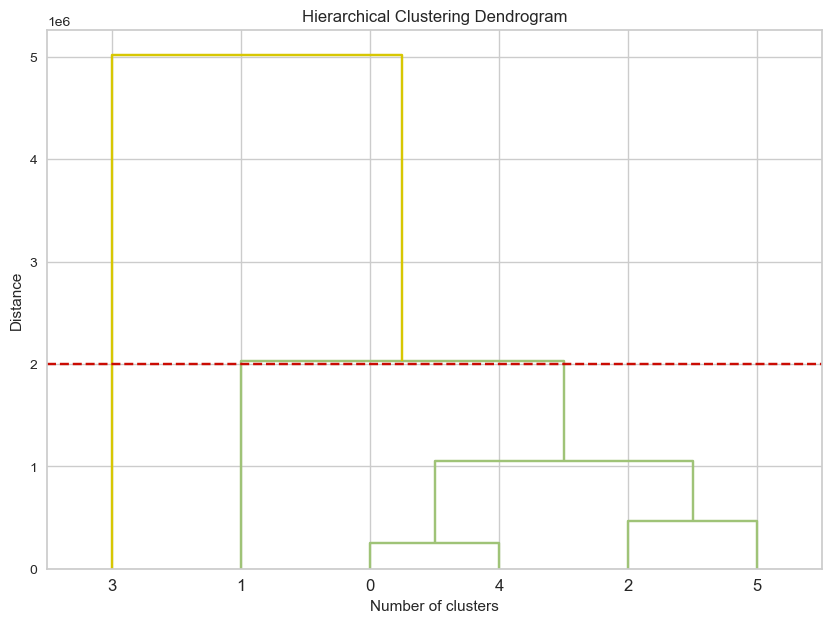

In [60]:
# Assuming centroids are obtained from kmeans.cluster_centers_
# already created centroids_kemans dataframe from centroids = kmeans.cluster_centers_

# Apply hierarchical clustering on the centroids

Z = linkage(centroids_, method='ward')

# Generate labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Plot the hierarchical clustering as a dendrogram
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram')
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top')
plt.axhline(y=2e6, color='r', linestyle='--')

plt.xlabel('Number of clusters')
plt.ylabel('Distance')
plt.show()

In [61]:
## see this to understand the optimal number of clusters: https://www.youtube.com/watch?v=4DInt3H2UNE 
## another source: https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/ 

print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'y']


## Agglomerative CLsutering 
source: https://www.kaggle.com/code/heeraldedhia/hierarchical-clustering-for-customer-data 

guide: https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/ 

In [62]:
from sklearn.cluster import AgglomerativeClustering 

hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage ='ward')

y_hc = hc.fit_predict(data)

C:\Users\tadnan\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [63]:
hc.feature_names_in_ 

array(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone', 'kmeans_data_cluster'], dtype=object)

In [64]:
Hierarchical_cluster = pd.DataFrame(y_hc)
Hierarchical_cluster.head(100) 

,0
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,0


In [65]:
data.insert((data.shape[1]),'Hierarchical_cluster',Hierarchical_cluster)

In [66]:
## data.insert(2, 'Year', '2017') 

In [67]:
data.shape 

(65201, 19)

In [68]:
save = data.head(20)
save.to_csv('Final_outputs.csv') 

In [69]:
type(data) 

pandas.core.frame.DataFrame

In [70]:
data.describe() 

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,6.520100e+04,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000,65201.000000
mean,22388.890015,2018.725510,118.760102,65354.869832,72.705779,12.927171,1125.110064,35467.948436,4.141423e+05,39.156033,59.161534,3.965267,83770.732819,75.728562,10.138065,3.954353,4.957740,1.534915,1.135228
std,29548.243568,1.132146,71.359779,32923.903734,9.923673,5.099382,364.969303,12681.132044,5.128436e+05,4.622718,5.487777,2.035288,17952.234776,16.267364,10.860859,5.761095,6.279984,1.859253,0.428342
min,2.000000,2017.000000,30.000000,199.000000,34.900000,0.469231,239.966615,10001.000000,6.238500e+04,24.800000,34.000000,0.200000,47034.000000,11.705690,0.079000,0.000000,0.000000,0.000000,0.000000
25%,4467.000000,2018.000000,65.500000,39430.000000,72.115401,9.384615,1015.550385,24021.000000,1.322300e+05,36.300000,56.000000,2.500000,70858.000000,68.679045,2.602237,1.277595,1.028498,0.000000,1.000000
50%,12511.000000,2019.000000,98.300000,71317.000000,75.900000,11.500000,1215.300000,39093.000000,2.370850e+05,39.000000,59.500000,4.000000,80563.000000,79.260141,6.608523,2.317974,2.473675,0.000000,1.000000
75%,27759.000000,2020.000000,152.700000,99998.000000,77.500000,16.900000,1350.400000,45091.000000,4.802350e+05,42.000000,62.800000,5.000000,93275.500000,87.827890,13.528607,4.507610,6.531472,4.000000,1.000000
max,373000.000000,2020.000000,615.000000,99999.000000,87.600000,25.300000,3145.300000,56025.000000,5.211263e+06,69.000000,76.100000,13.800000,176974.000000,96.816372,73.291523,42.225941,57.934381,5.000000,2.000000


## we checked that the maximum, minimum stat for the are the same in different IRI values because IRI in the same areas, in different rurual and semi urban areas varies.  please check here. see same max population for same areas with different IRI. so calculating mean or median and comparison based on median or mean are efficient here


In [71]:
## see same max population for same areas with different IRI. so calculating mean or median and comparison based on median or mean are efficient here
data[data['Total Population'] == 5211263.0]

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
4277,209198.0,2017,110.3,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4278,179974.0,2017,102.6,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4279,112806.0,2017,96.7,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4280,32069.0,2017,127.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4281,61380.0,2017,91.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4282,9050.0,2017,165.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4283,19319.0,2017,183.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4284,41200.0,2017,171.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4285,73312.0,2017,109.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0
4286,50000.0,2017,115.0,16264.0,75.8,9.4,1081.6,17031,5211263.0,36.8,61.1,0.2,90072.0,56.391934,23.406149,7.266549,9.983492,3,0


In [72]:
import plotly.graph_objs as go
import plotly as py

trace1 = go.Scatter3d(
    x= data['IRI_mean'],
    y= data['RHU_AV'],
    z= data['Mean income Household (dollars)'],
    mode='markers',
     marker=dict(
        color = data['Hierarchical_cluster'], 
        size= 10,
        line=dict(
            color= data['Hierarchical_cluster'],
            width= 12
        ),
        opacity=0.8
     )
)
data_ = [trace1]
layout = go.Layout(
    title= 'Clusters using Agglomerative Clustering',
    scene = dict(
            xaxis = dict(title  = 'IRI_mean'),
            yaxis = dict(title  = 'RHU_AV'),
            zaxis = dict(title  = 'Mean income Household (dollars)')
        )
)
fig = go.Figure(data=data_, layout=layout)
py.offline.iplot(fig)

#### [:, [3,4]]: This part specifies which rows and columns to select. The colon : before the comma indicates that you want to include all rows. After the comma, [3,4] specifies that you want to select the columns at positions 3 and 4. In Python, indexing starts at 0, so these correspond to the fourth and fifth columns of the DataFrame.

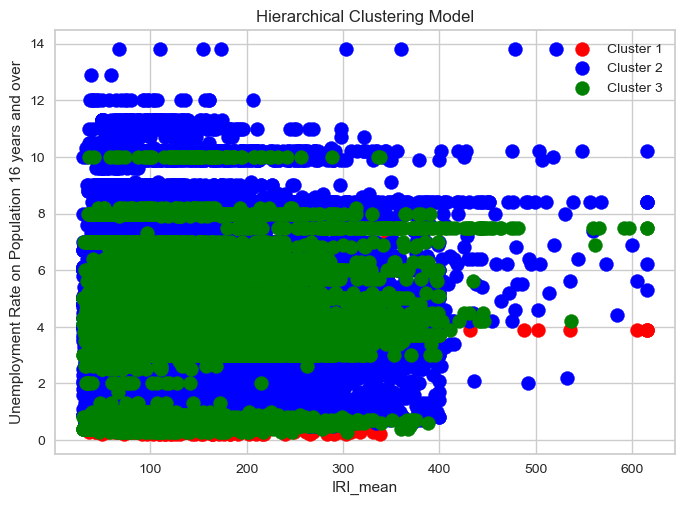

In [73]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df_2017 is your DataFrame
# Let's find the column names for positions 3 and 14
x_axis_name = data.columns[2]
y_axis_name = data.columns[11]

X = data.iloc[:, [2,11]].values

plt.scatter(X[y_hc==0, 0], X[y_hc==0, 1], s=100, c='red', label ='Cluster 1')
plt.scatter(X[y_hc==1, 0], X[y_hc==1, 1], s=100, c='blue', label ='Cluster 2')
plt.scatter(X[y_hc==2, 0], X[y_hc==2, 1], s=100, c='green', label ='Cluster 3')
# plt.scatter(X[y_hc==3, 0], X[y_hc==3, 1], s=100, c='purple', label ='Cluster 4')
# plt.scatter(X[y_hc==4, 0], X[y_hc==4, 1], s=100, c='orange', label ='Cluster 5')
#plt.scatter(X[y_hc==5, 0], X[y_hc==5, 1], s=100, c='yellow', label ='Cluster 6')


plt.title('Hierarchical Clustering Model')
plt.xlabel(x_axis_name)  # Ensure this is set after defining the figure
plt.ylabel(y_axis_name)  # Ensure this is set after defining the figure
plt.legend()
plt.savefig("agglomerative_clustering.png")
plt.show()

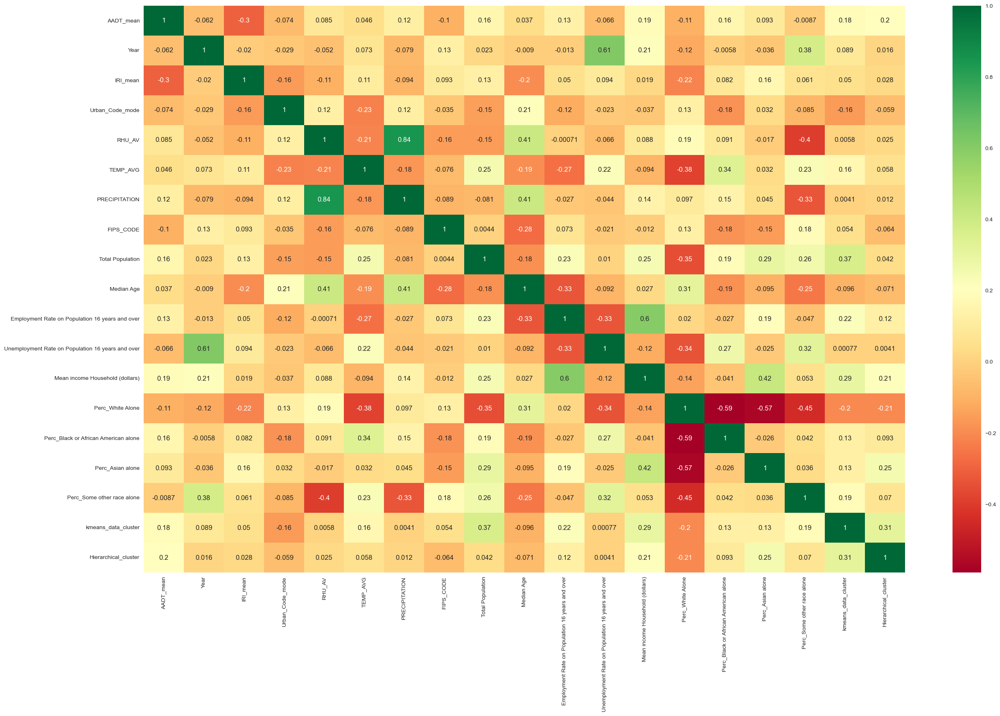

In [74]:
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(30,18))

#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.savefig('correlation_k-means.png')

In [75]:
# data.plot(x='IRI_mean', y=['RHU_AV', 'FRZ_IDX'], kind="bar")

In [76]:
# data.plot(x='IRI_mean', y=['TEMP_AVG'], kind="bar")

In [77]:
# data.plot(x='IRI_mean', y=['PRECIPITATION'], kind="bar")

### From these graphs we can see that traffic and climate factors have influential patterns on pavement conditons. these factors imapacts social parameters in different urban and rural areas. 

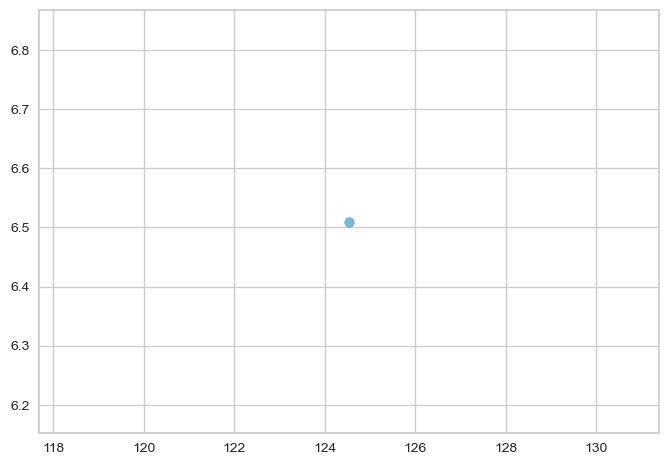

In [78]:
cluster_5 = centroids_[centroids_.index == 5]
plt.scatter(cluster_5[column_x], cluster_5[column_y], alpha=0.5, label='Cluster 5')

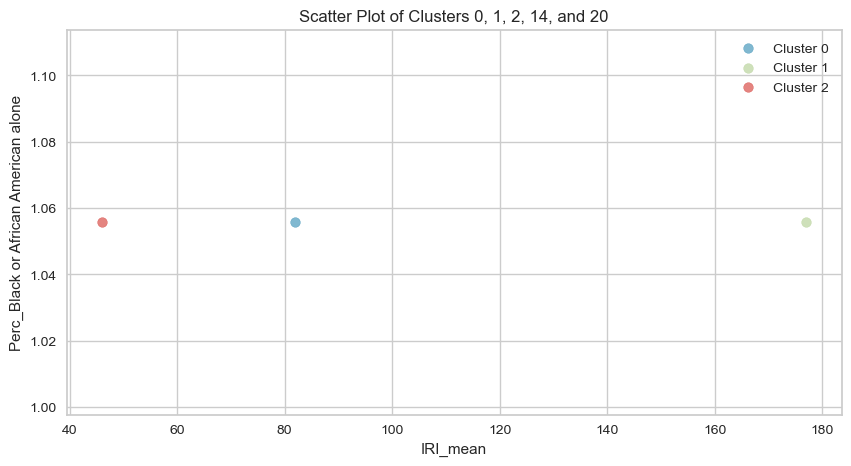

In [79]:
## check how IRI and mean household incomes are related in every clusters

column_x = data.columns[2]  # Replace with your actual column name or index
column_y = data.columns[14]  # Replace with your actual column name or index

# Start a new figure
plt.figure(figsize=(10, 5))

# Filter the dataframe for cluster 0 and plot
cluster_0 = data[data.index== 0]
plt.scatter(cluster_0[column_x], cluster_0[column_y], alpha=0.5, label='Cluster 0')

cluster_1 = data[data.index== 1]
plt.scatter(cluster_1[column_x], cluster_1[column_y], alpha=0.5, label='Cluster 1')

cluster_2 = data[data.index== 2]
plt.scatter(cluster_2[column_x], cluster_2[column_y], alpha=0.5, label='Cluster 2')

# Add the legend, title, and labels
plt.legend()
plt.title('Scatter Plot of Clusters 0, 1, 2, 14, and 20')
plt.xlabel(column_x)
plt.ylabel(column_y)
plt.show()

## Check cluster 1

(2169, 19)


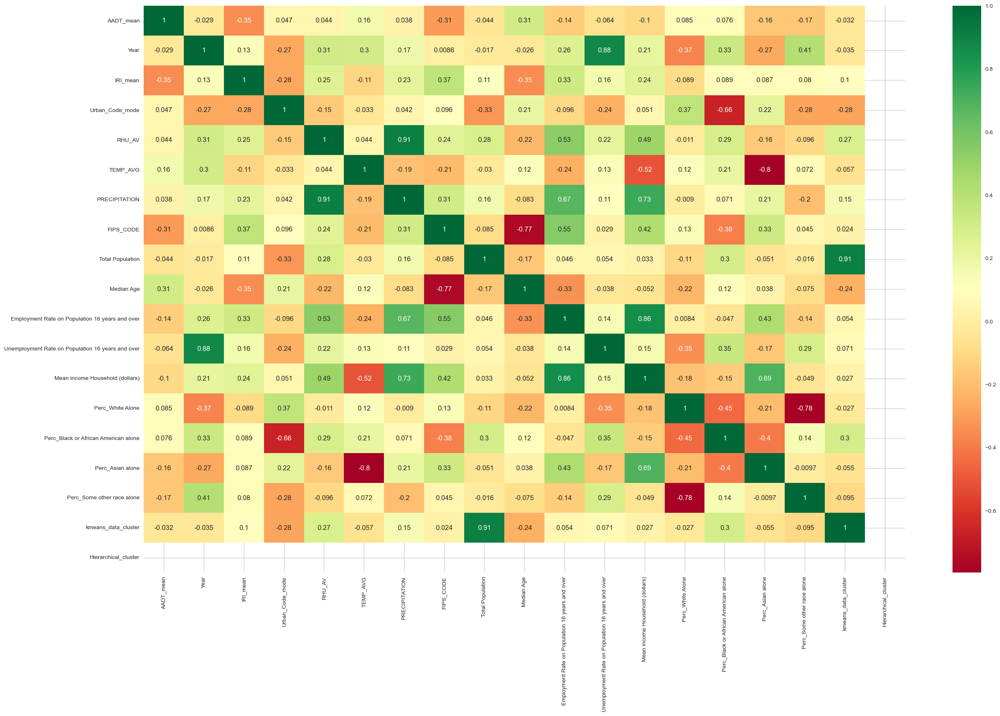

In [80]:
cluster_1 = data[data['Hierarchical_cluster'] == 0]
print(cluster_1.shape)

#get correlations of each features in dataset
corrmat = cluster_1.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(30,18))

#plot heat map
g=sns.heatmap(cluster_1[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# Save the figure BEFORE plt.show()
plt.savefig("Correlation in Cluster 1.png")

# Display the plot
plt.show()

In [81]:
# cluster_1.plot(x = "IRI_mean", y = 'Total Population', kind='barh', width=0.8, stacked = True, legend=True, fontsize=14, figsize=(20, 8))

## Check cluster 2

(52046, 19)


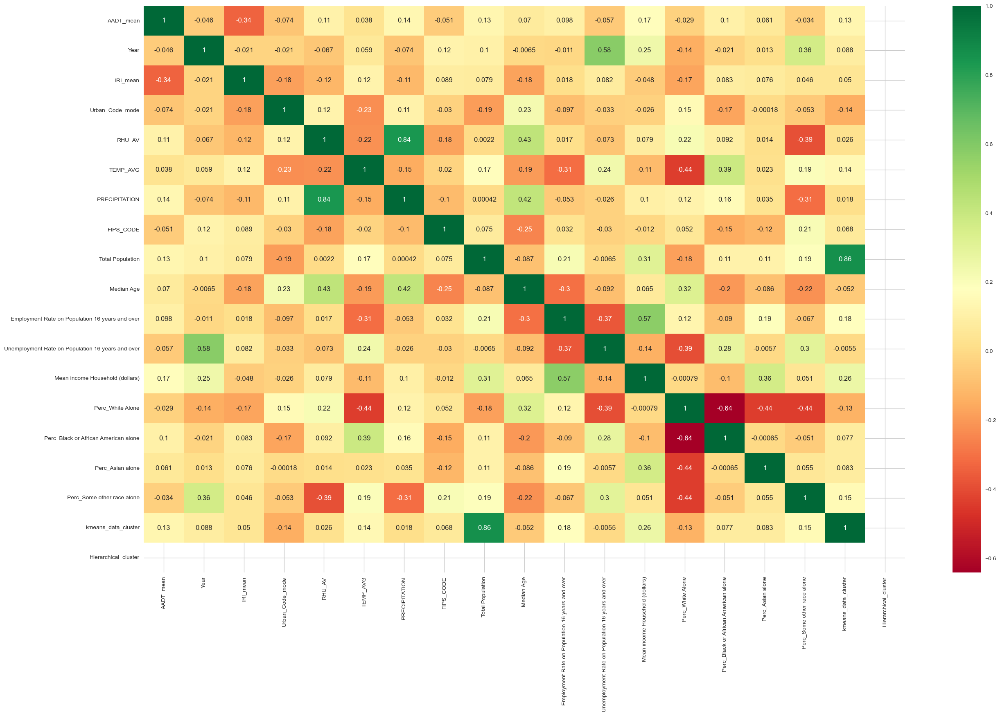

In [82]:
cluster_2 = data[data['Hierarchical_cluster'] == 1]
print(cluster_2.shape)

#get correlations of each features in dataset
corrmat = cluster_2.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(30,18))

#plot heat map
g=sns.heatmap(cluster_2[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# Save the figure BEFORE plt.show()
plt.savefig("Correlation in Cluster 2.png")

# Display the plot
plt.show()

## Check cluster 3

(10986, 19)


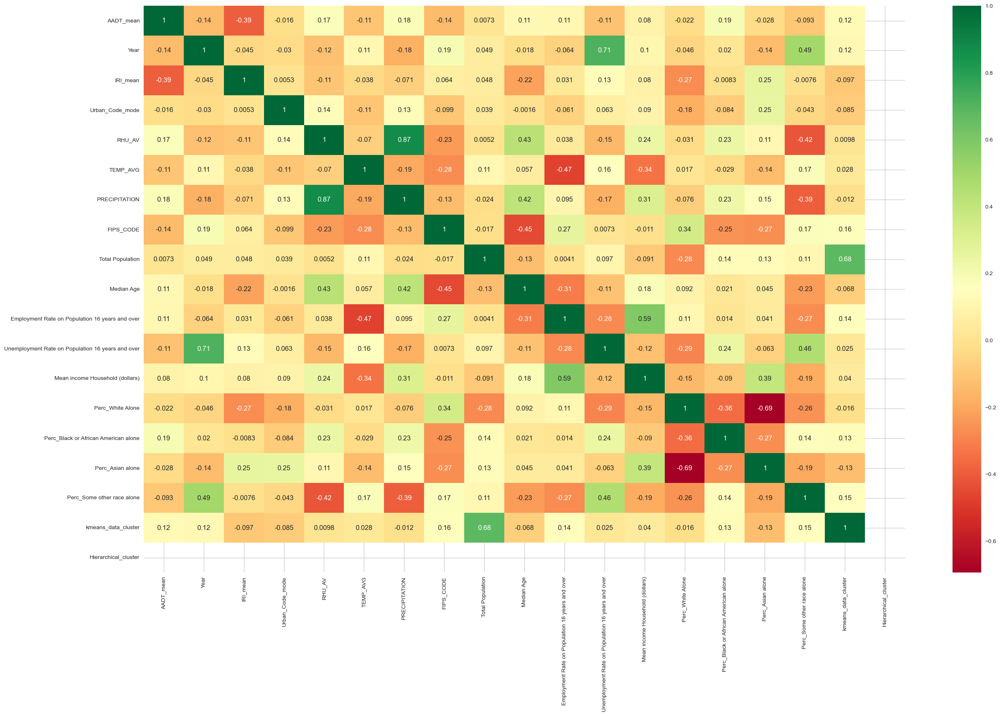

In [83]:
cluster_3 = data[data['Hierarchical_cluster'] == 2]
print(cluster_3.shape)

#get correlations of each features in dataset
corrmat = cluster_3.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(30,18))

#plot heat map
g=sns.heatmap(cluster_3[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# Save the figure BEFORE plt.show()
plt.savefig("Correlation in Cluster 3.png")

# Display the plot
plt.show()

In [84]:
# Sorting by 'IRI_mean' in ascending order
X = cluster_3.sort_values(by=['IRI_mean'],ascending=[True]).head(10)
print(X.columns)
X.head(10)

Index(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone', 'kmeans_data_cluster',
       'Hierarchical_cluster'],
      dtype='object')


,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
5852,55064.0,2017,30.0,69697.0,76.300000,10.300000,1280.200000,42003,1223048.0,41.0,61.4,0.4,83152.0,79.679702,12.642186,3.832720,0.451413,5,2
59568,16700.0,2020,30.0,96697.0,76.250000,22.069231,1129.008154,12105,739148.0,40.0,53.0,5.0,71133.5,65.111723,14.994020,1.777317,20.657027,2,2
694,45000.0,2017,30.0,38809.0,74.200000,14.600000,1219.100000,37081,526953.0,37.6,60.7,0.8,72571.0,55.797386,34.410279,5.181866,1.770367,4,2
64487,100355.0,2020,30.0,61165.0,79.500000,7.546154,1291.291539,33011,678140.0,42.0,66.0,3.0,132494.5,74.836759,4.577226,12.757543,5.297431,2,2
55523,35634.0,2020,30.0,69697.0,76.333333,10.323077,1280.222923,42003,1227068.0,41.0,62.0,5.0,94397.0,77.921354,12.354083,3.957401,1.895168,5,2
34444,65323.0,2019,30.0,69697.0,76.300000,10.300000,1280.200000,42003,1216045.0,40.5,62.7,4.1,91448.0,79.414495,12.939653,3.862110,0.654005,5,2
5858,48800.0,2017,30.0,69697.0,76.300000,10.300000,1280.200000,42003,1223048.0,41.0,61.4,0.4,83152.0,79.679702,12.642186,3.832720,0.451413,5,2
64483,92453.0,2020,30.0,61165.0,79.500000,7.546154,1291.291539,33011,678140.0,42.0,66.0,3.0,132494.5,74.836759,4.577226,12.757543,5.297431,2,2
38760,15800.0,2019,30.0,96697.0,76.200000,22.100000,1129.000000,12105,724777.0,40.2,53.5,4.3,67906.0,75.013556,15.296843,1.793793,5.091635,2,2
5851,55064.0,2017,30.0,69697.0,76.300000,10.300000,1280.200000,42003,1223048.0,41.0,61.4,0.4,83152.0,79.679702,12.642186,3.832720,0.451413,5,2


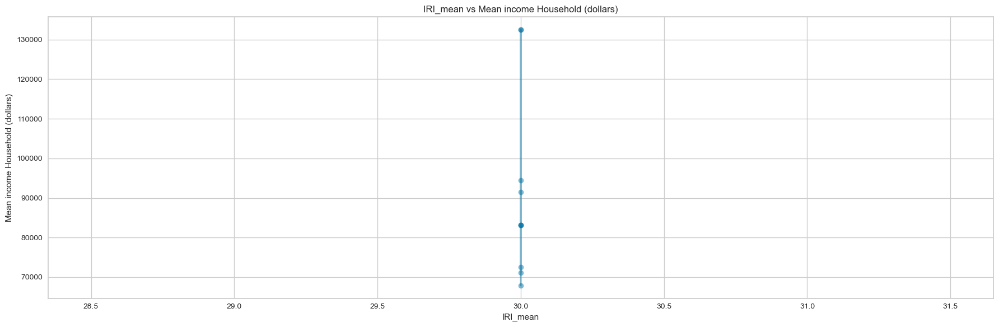

In [85]:
# List of variables to plot against 'IRI_mean'
variables_to_plot = ['Mean income Household (dollars)']

for i, variable in enumerate(variables_to_plot, 1):
    plt.figure(figsize=(18, 6))
    plt.subplot(1, len(variables_to_plot), i)
    plt.plot(X['IRI_mean'], X[variable], marker='o', linestyle='-',alpha=0.5)
    plt.title(f'IRI_mean vs {variable}')
    plt.xlabel('IRI_mean')
    plt.ylabel(variable)
    plt.tight_layout()
    plt.show()

# check avagerage values of the parameters in good, medium and bad pavements in cluster 2

## Good pavements (mean_IRI =< 95)

In [86]:
g_pavements = cluster_2[cluster_2['IRI_mean'] <= 95]
g_pavements.describe()

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.000000,25869.0
mean,25796.739495,2018.737330,64.803947,73492.217403,74.445326,11.973135,1175.084105,34576.532375,215560.474583,40.275503,58.350756,3.854039,81659.922919,80.662355,8.694740,2.646072,3.900622,1.140593,1.0
std,24264.365005,1.173587,16.641323,32167.014977,8.074928,4.912015,319.384459,12226.996400,126020.470753,4.896120,5.701054,2.013156,17303.224942,13.004356,9.801761,2.723939,5.201192,1.805847,0.0
min,2.000000,2017.000000,30.000000,199.000000,35.666667,0.469231,239.966615,10001.000000,62385.000000,24.800000,34.000000,0.500000,48129.000000,11.705690,0.079000,0.000000,0.000000,0.000000,1.0
25%,8566.000000,2017.000000,51.000000,49852.000000,74.200000,8.700000,1082.300000,24003.000000,111750.000000,37.400000,55.000000,2.300000,69161.000000,73.819948,2.342986,1.083594,0.732909,0.000000,1.0
50%,19298.000000,2019.000000,64.200000,90514.000000,76.333333,10.523077,1268.500000,39023.000000,176824.000000,40.200000,58.500000,4.000000,78647.000000,84.023776,5.432675,1.877894,1.919966,0.000000,1.0
75%,34321.000000,2020.000000,78.500000,99999.000000,78.000000,14.900000,1358.900000,42089.000000,295003.000000,43.100000,62.000000,5.000000,89989.000000,90.428927,11.971372,3.331960,5.284687,4.000000,1.0
max,218000.000000,2020.000000,95.000000,99999.000000,87.600000,24.800000,3145.300000,56025.000000,611648.000000,69.000000,76.100000,13.800000,176974.000000,96.816372,73.153089,33.715498,42.104133,4.000000,1.0


In [87]:
pd.to_numeric(g_pavements['IRI_mean'], errors='coerce')
print(g_pavements.shape) 

(25869, 19)


In [88]:
g_pavements.head(10)

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0,1395.0,2017,82.0,99999.0,78.5,5.6,1089.7,55073,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,0,1
2,415.0,2017,46.0,99999.0,78.5,5.6,1089.7,55073,135732.0,40.5,66.0,0.9,77209.0,90.135709,1.055757,5.919017,1.160375,0,1
6,40961.0,2017,64.0,47719.0,76.2,8.5,1068.6,26037,78443.0,41.2,59.7,1.2,82870.0,93.061204,1.862499,1.745216,0.442359,0,1
140,1959.0,2017,90.7,20287.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1
144,9518.0,2017,59.0,99999.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1
145,11991.0,2017,78.0,20287.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1
149,48545.0,2017,93.0,20287.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1
150,48545.0,2017,51.7,20287.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1
151,52866.0,2017,45.5,20287.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1
152,82606.0,2017,56.8,20287.0,74.7,23.0,840.2,48355,361221.0,35.6,58.0,1.2,73398.0,90.830267,3.596690,2.120309,1.368691,4,1


In [89]:
g_pavements.mean()

AADT_mean                                             25796.739495
Year                                                   2018.737330
IRI_mean                                                 64.803947
Urban_Code_mode                                       73492.217403
RHU_AV                                                   74.445326
TEMP_AVG                                                 11.973135
PRECIPITATION                                          1175.084105
FIPS_CODE                                             34576.532375
Total Population                                     215560.474583
Median Age                                               40.275503
Employment Rate on Population 16 years and over          58.350756
Unemployment Rate on Population 16 years and over         3.854039
Mean income Household (dollars)                       81659.922919
Perc_White Alone                                         80.662355
Perc_Black or African American alone                      8.69

In [90]:
Good_Condtion_Pavements = g_pavements.quantile([0.25, 0.50, 0.75])
Good_Condtion_Pavements = Good_Condtion_Pavements.round(2)
Good_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,8566.0,2017.0,51.0,49852.0,74.20,8.70,1082.3,24003.0,111750.0,37.4,55.0,2.3,69161.0,73.82,2.34,1.08,0.73,0.0,1.0
0.50,19298.0,2019.0,64.2,90514.0,76.33,10.52,1268.5,39023.0,176824.0,40.2,58.5,4.0,78647.0,84.02,5.43,1.88,1.92,0.0,1.0
0.75,34321.0,2020.0,78.5,99999.0,78.00,14.90,1358.9,42089.0,295003.0,43.1,62.0,5.0,89989.0,90.43,11.97,3.33,5.28,4.0,1.0


<Figure size 3000x1800 with 0 Axes>

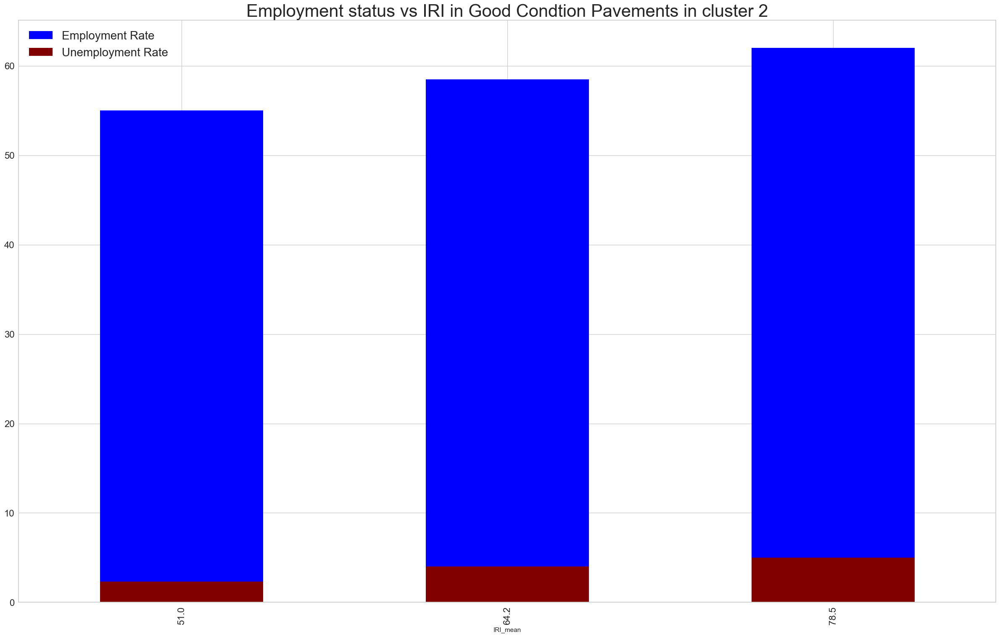

In [91]:
import matplotlib.pyplot as plt

# Assuming 'Good_Pavements' is your DataFrame

# Set the figure size first
plt.figure(figsize=(30, 18))

# Plot the first metric
ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate', figsize=(30,18), fontsize=16)

# Overlay the second metric
Good_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate', fontsize=16)

# Legend and Title
plt.legend(loc='upper left', fontsize=20) 
plt.title("Employment status vs IRI in Good Condtion Pavements in cluster 2", fontsize=30)

# Save the figure BEFORE plt.show()
plt.savefig("Employment status vs IRI in Good_Condtion_Pavements in cluster 2.png")

# Display the plot
plt.show()


<Figure size 3000x1800 with 0 Axes>

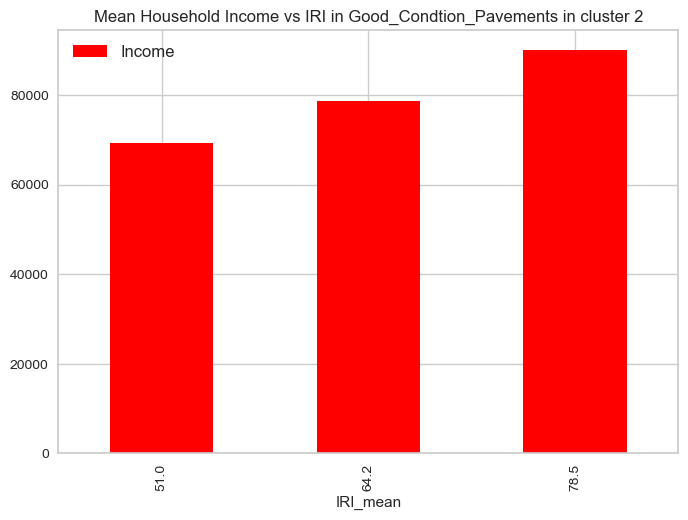

In [92]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Mean Household Income vs IRI in Good_Condtion_Pavements in cluster 2")
plt.savefig("Mean Household Income vs IRI in Good Condtion Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

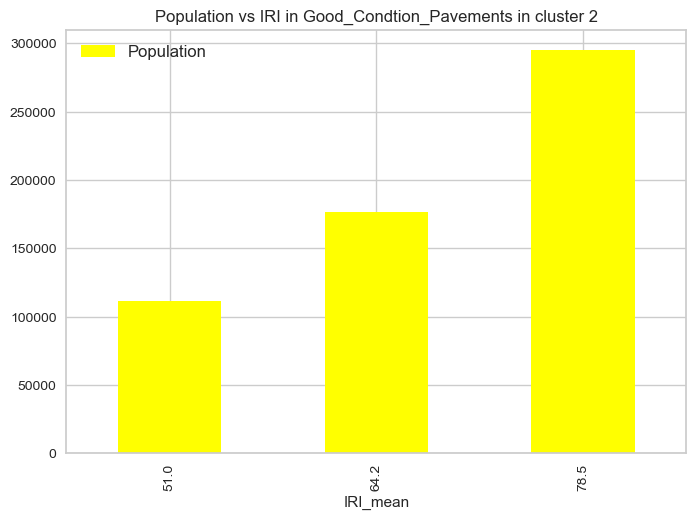

In [93]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Population vs IRI in Good_Condtion_Pavements in cluster 2")
plt.savefig("Population vs IRI in Good Condtion Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

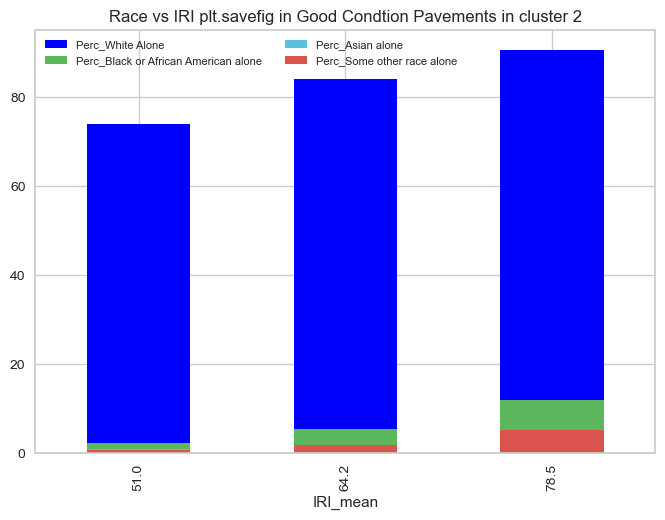

In [94]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metric with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f'] # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']


for metric, color in zip(second_metrics, colors):
    Good_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(loc='upper left', fontsize=8, ncol=2) 

plt.title('Race vs IRI plt.savefig in Good Condtion Pavements in cluster 2')
plt.savefig("Race vs IRI plt.savefig in Good_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

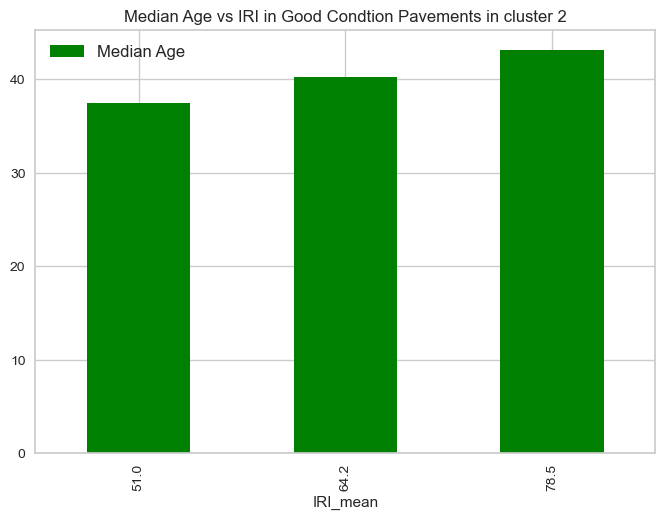

In [95]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Good Condtion Pavements in cluster 2")
plt.savefig("Median Agevs IRI in Good_Condtion_Pavements in cluster 2.png")
plt.show()

## Acceptable pavements (95 <= mean_IRI =< 170)

In [96]:
m_pavements = cluster_2[(cluster_2['IRI_mean'] > 95) & (cluster_1['IRI_mean'] <= 170)]
m_pavements.describe()

C:\Users\tadnan\AppData\Local\Temp\ipykernel_14140\2857310762.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
pd.to_numeric(m_pavements['IRI_mean'], errors='coerce')
m_pavements.round(0).head(5)

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster


In [98]:
m_pavements.mean()

AADT_mean                                           NaN
Year                                                NaN
IRI_mean                                            NaN
Urban_Code_mode                                     NaN
RHU_AV                                              NaN
TEMP_AVG                                            NaN
PRECIPITATION                                       NaN
FIPS_CODE                                           NaN
Total Population                                    NaN
Median Age                                          NaN
Employment Rate on Population 16 years and over     NaN
Unemployment Rate on Population 16 years and over   NaN
Mean income Household (dollars)                     NaN
Perc_White Alone                                    NaN
Perc_Black or African American alone                NaN
Perc_Asian alone                                    NaN
Perc_Some other race alone                          NaN
kmeans_data_cluster                             

In [99]:
Acceptable_Condtion_Pavements = m_pavements.quantile([0.25, 0.50, 0.75])
Acceptable_Condtion_Pavements= Acceptable_Condtion_Pavements.round(2)
Acceptable_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Figure size 3000x1800 with 0 Axes>

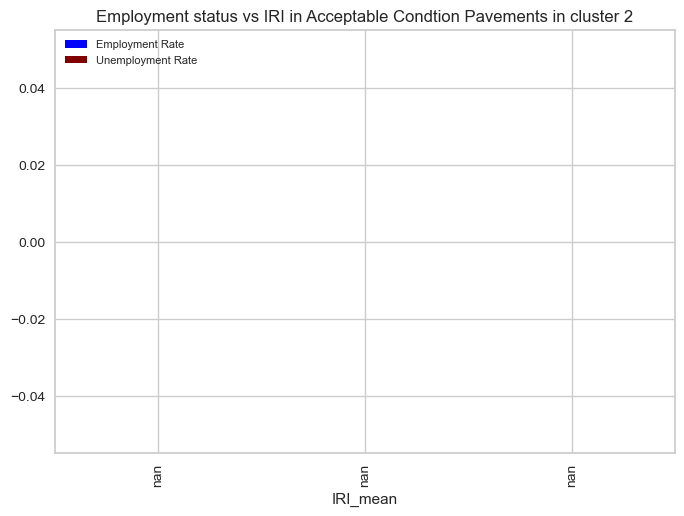

In [100]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend(loc='upper left', fontsize=8) 

plt.title("Employment status vs IRI in Acceptable Condtion Pavements in cluster 2")
plt.savefig("Employment status vs IRI in Acceptable_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

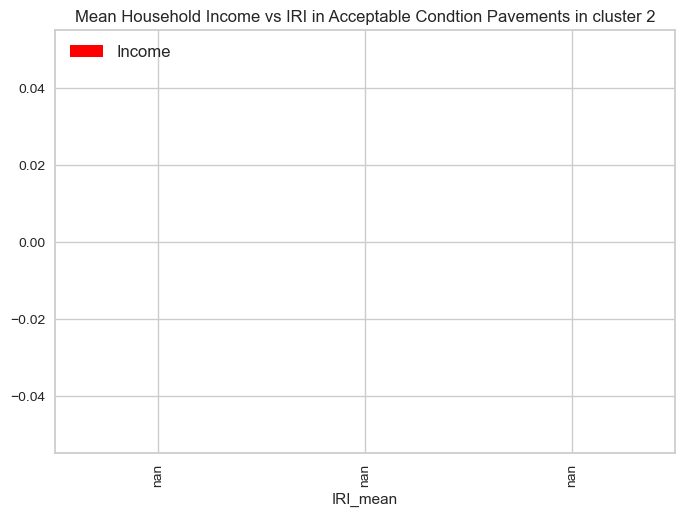

In [101]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Mean Household Income vs IRI in Acceptable Condtion Pavements in cluster 2')
plt.savefig("Mean Household Income vs IRI in Acceptable_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

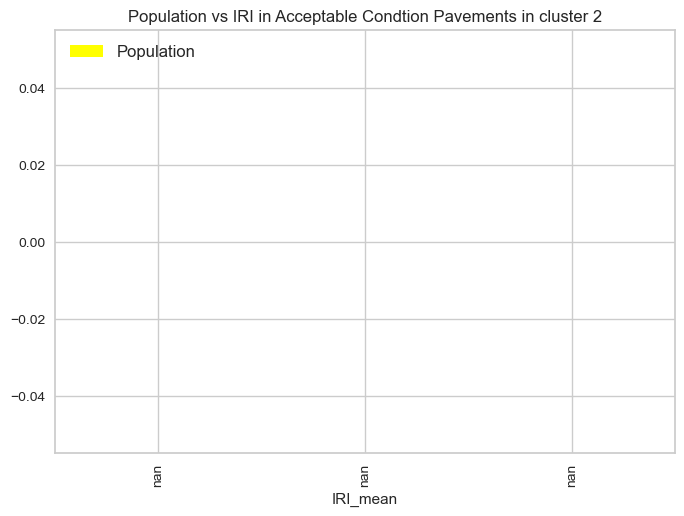

In [102]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Population vs IRI in Acceptable Condtion Pavements in cluster 2')
plt.savefig("Population vs IRI in Acceptable_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 6000x3000 with 0 Axes>

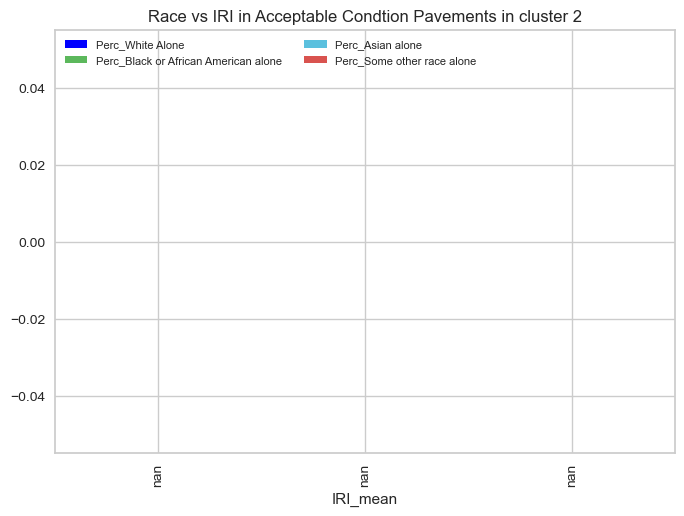

In [103]:
plt.figure(figsize=(60,30))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metric with corrected labels
colors =  ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

for metric, color in zip(second_metrics, colors):
    Acceptable_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(loc='upper left', fontsize=8,  ncol=2) 

plt.title('Race vs IRI in Acceptable Condtion Pavements in cluster 2')
plt.savefig("Race vs IRI in Acceptable_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

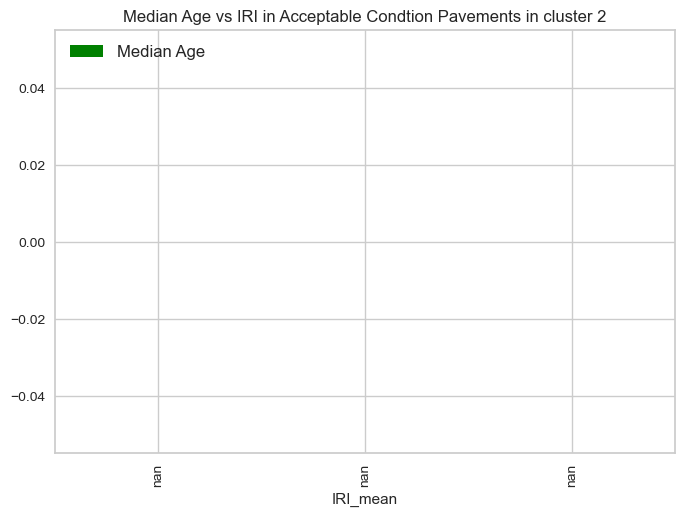

In [104]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Acceptable Condtion Pavements in cluster 2")
plt.savefig("Median Agevs IRI in Acceptable_Condtion_Pavements in cluster 2.png")
plt.show()

## Poor Pavements > 170

In [105]:
b_pavements = cluster_2[cluster_2['IRI_mean'] > 170]
print(b_pavements.columns)

Index(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone', 'kmeans_data_cluster',
       'Hierarchical_cluster'],
      dtype='object')


In [106]:
pd.to_numeric(m_pavements['IRI_mean'], errors='coerce')
b_pavements.describe()

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.00000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.0
mean,7795.817040,2018.702221,233.726318,58180.065672,71.500572,13.489246,1068.841851,37647.683013,243560.886576,38.12482,58.699369,4.264365,79765.209196,74.630313,10.487241,3.385693,4.688163,1.400579,1.0
std,10279.564537,1.066005,57.699816,32091.321349,10.265288,5.173334,393.019409,11875.030941,136307.830493,4.20198,5.031906,2.076514,15018.822767,16.875863,12.893891,4.855351,6.110694,1.907038,0.0
min,23.000000,2017.000000,170.100000,199.000000,35.666667,0.469231,239.966615,10001.000000,62607.000000,25.00000,36.100000,0.500000,47034.000000,11.705690,0.079000,0.000000,0.000000,0.000000,1.0
25%,1500.000000,2018.000000,190.000000,32194.000000,69.700000,9.600000,846.300000,28049.000000,132230.000000,35.20000,55.800000,2.900000,69125.000000,67.894992,2.277963,1.157810,1.050204,0.000000,1.0
50%,4174.000000,2019.000000,217.000000,58168.000000,74.800000,12.384615,1135.418405,40017.000000,206650.000000,38.20000,58.629330,4.200000,77305.000000,78.844820,5.789264,2.233876,2.305103,0.000000,1.0
75%,10398.000000,2020.000000,262.000000,87193.000000,77.200000,17.900000,1323.900000,48187.000000,326120.000000,41.00000,62.000000,5.400000,89263.500000,87.300071,13.717831,3.852094,5.751341,4.000000,1.0
max,215172.000000,2020.000000,615.000000,99999.000000,87.600000,24.800000,3145.300000,56025.000000,611648.000000,60.20000,76.100000,13.800000,158886.000000,96.406437,73.153089,33.715498,42.104133,4.000000,1.0


In [107]:
b_pavements.mean()

AADT_mean                                              7795.817040
Year                                                   2018.702221
IRI_mean                                                233.726318
Urban_Code_mode                                       58180.065672
RHU_AV                                                   71.500572
TEMP_AVG                                                 13.489246
PRECIPITATION                                          1068.841851
FIPS_CODE                                             37647.683013
Total Population                                     243560.886576
Median Age                                               38.124820
Employment Rate on Population 16 years and over          58.699369
Unemployment Rate on Population 16 years and over         4.264365
Mean income Household (dollars)                       79765.209196
Perc_White Alone                                         74.630313
Perc_Black or African American alone                     10.48

In [108]:
Poor_Condtion_Pavements = b_pavements.quantile([0.25, 0.50, 0.75])
Poor_Condtion_Pavements=Poor_Condtion_Pavements.round(2)
Poor_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,1500.0,2018.0,190.0,32194.0,69.7,9.60,846.30,28049.0,132230.0,35.2,55.80,2.9,69125.0,67.89,2.28,1.16,1.05,0.0,1.0
0.50,4174.0,2019.0,217.0,58168.0,74.8,12.38,1135.42,40017.0,206650.0,38.2,58.63,4.2,77305.0,78.84,5.79,2.23,2.31,0.0,1.0
0.75,10398.0,2020.0,262.0,87193.0,77.2,17.90,1323.90,48187.0,326120.0,41.0,62.00,5.4,89263.5,87.30,13.72,3.85,5.75,4.0,1.0


<Figure size 3000x1800 with 0 Axes>

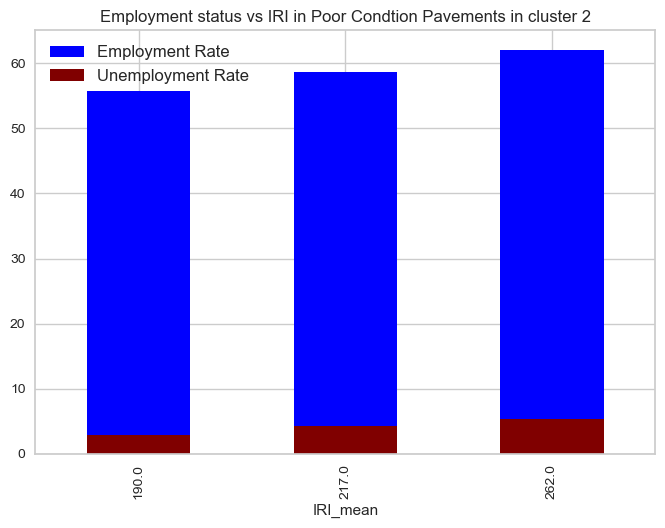

In [109]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Poor_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Employment status vs IRI in Poor Condtion Pavements in cluster 2')
plt.savefig("Employment status vs IRI in Poor_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

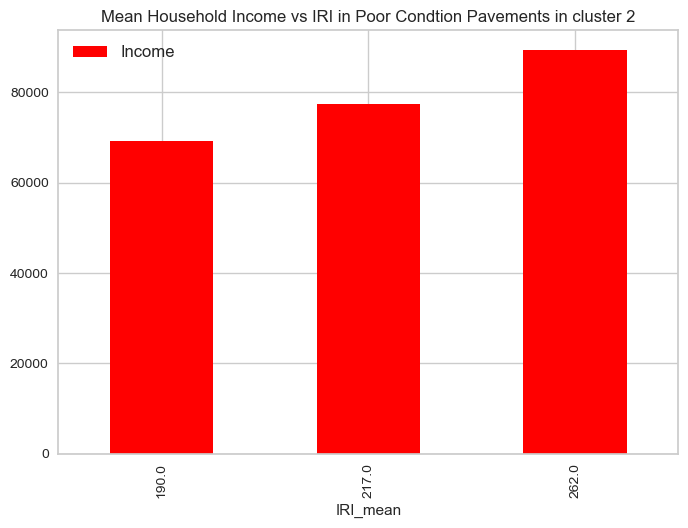

In [110]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Mean Household Income vs IRI in Poor Condtion Pavements in cluster 2')
plt.savefig("Mean Household Income vs IRI in Poor_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

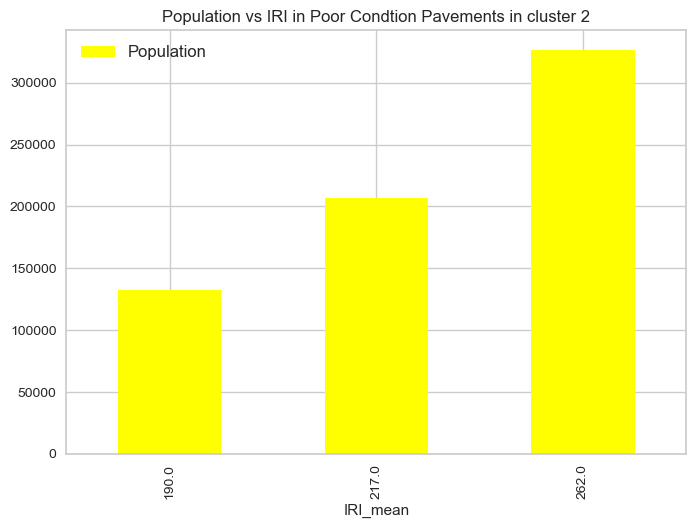

In [111]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Population vs IRI in Poor Condtion Pavements in cluster 2')
plt.savefig("Population vs IRI in Poor_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

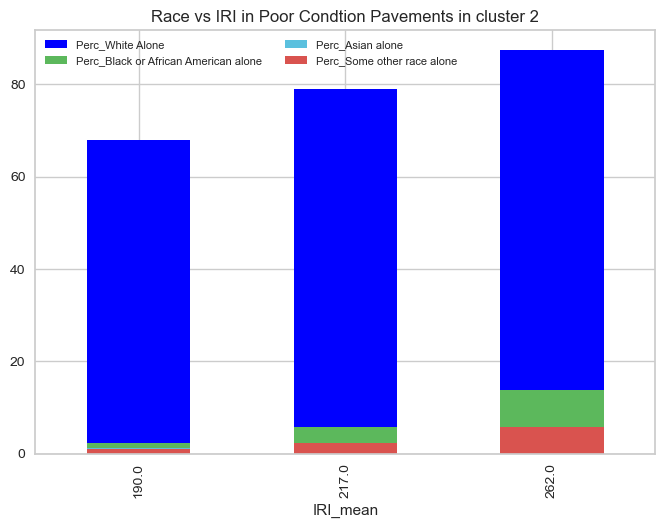

In [112]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metric with corrected labels
colors =  ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

for metric, color in zip(second_metrics, colors):
    Poor_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(fontsize=8,  ncol=2) 
plt.title('Race vs IRI in Poor Condtion Pavements in cluster 2')
plt.savefig("Race vs IRI in Poor_Condtion_Pavements in cluster 2.png")
plt.show()

<Figure size 3000x1800 with 0 Axes>

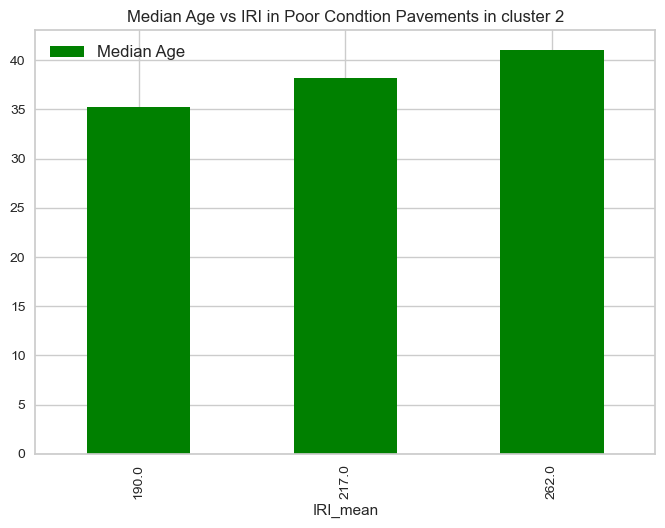

In [113]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Poor Condtion Pavements in cluster 2")
plt.savefig("Median Agevs IRI in Poor_Condtion_Pavements in cluster 2.png")
plt.show()

## Good, acceptable and poor pavements in cluster 1

## Good pavements 

In [114]:
g_pavements = cluster_1[cluster_1['IRI_mean'] <= 95]
g_pavements.describe()

pd.to_numeric(g_pavements['IRI_mean'], errors='coerce')
print(g_pavements.shape)

g_pavements.head(10)

g_pavements.mean()

Good_Condtion_Pavements = g_pavements.quantile([0.25, 0.50, 0.75])
Good_Condtion_Pavements = Good_Condtion_Pavements.round(2)
Good_Condtion_Pavements

(637, 19)


,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,9550.0,2017.0,53.0,47995.0,34.90,16.20,250.8,12086.0,2003554.0,36.9,59.8,0.5,78422.0,58.83,11.73,2.98,6.67,1.0,0.0
0.50,25621.0,2019.0,66.7,56602.0,67.60,16.20,894.7,32003.0,2233163.0,37.6,60.4,4.6,85925.0,59.37,12.32,7.58,11.36,1.0,0.0
0.75,67200.0,2019.0,81.0,80389.0,74.67,24.47,1154.8,48029.0,2391238.0,40.1,62.4,5.3,88786.0,63.87,17.23,10.20,12.45,1.0,0.0


<Figure size 3000x1800 with 0 Axes>

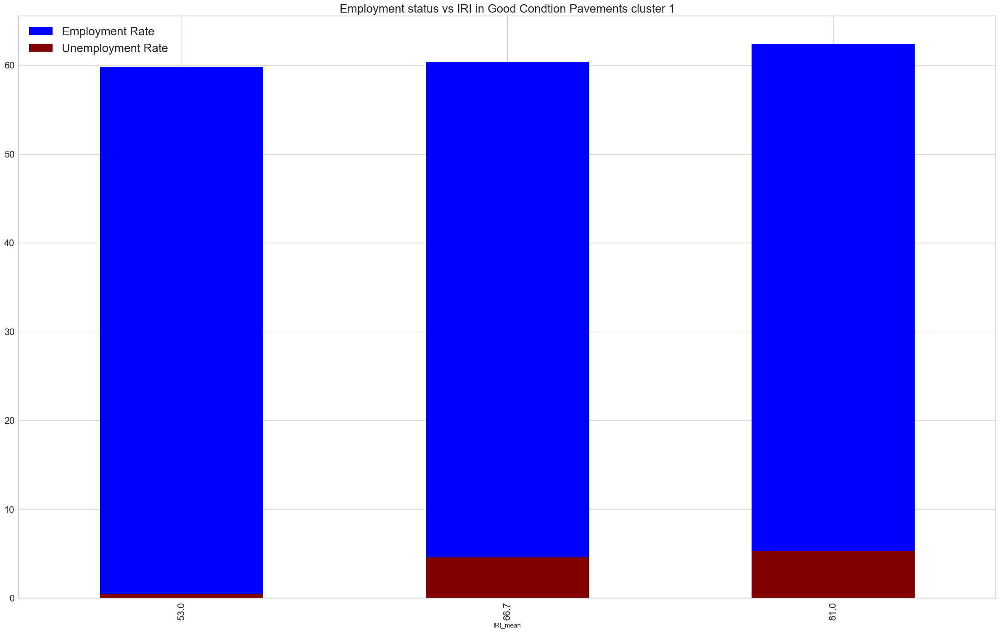

In [115]:
import matplotlib.pyplot as plt

# Assuming 'Good_Pavements' is your DataFrame

# Set the figure size first
plt.figure(figsize=(30, 18))

# Plot the first metric
ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate', figsize=(30,18), fontsize=16)

# Overlay the second metric
Good_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate', fontsize=16)

# Legend and Title
plt.legend(loc='upper left', fontsize=20) 
plt.title("Employment status vs IRI in Good Condtion Pavements cluster 1", fontsize=20)

# Display the plot
plt.show()


<Figure size 3000x1800 with 0 Axes>

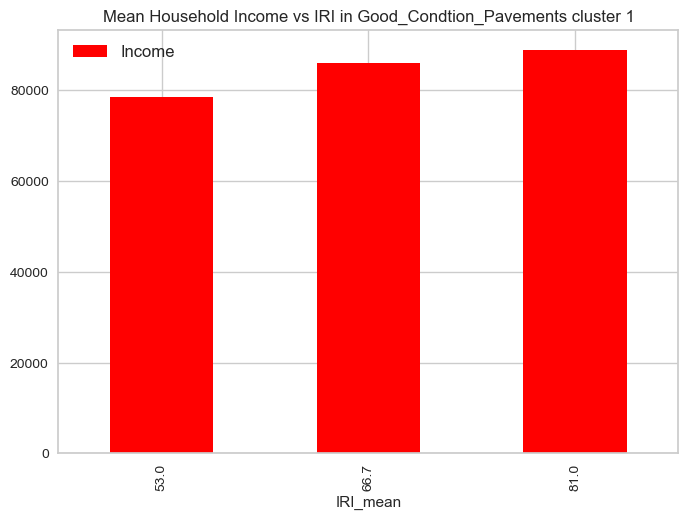

In [116]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Mean Household Income vs IRI in Good_Condtion_Pavements cluster 1")
plt.show()

<Figure size 3000x1800 with 0 Axes>

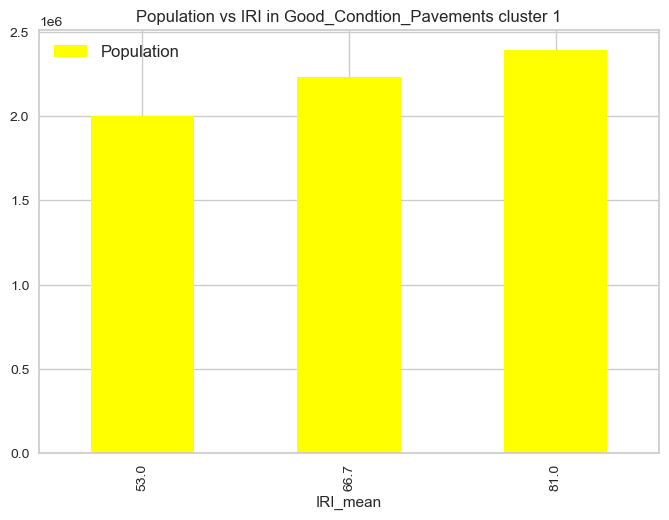

In [120]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Population vs IRI in Good_Condtion_Pavements cluster 1")
plt.show()

<Figure size 3000x1800 with 0 Axes>

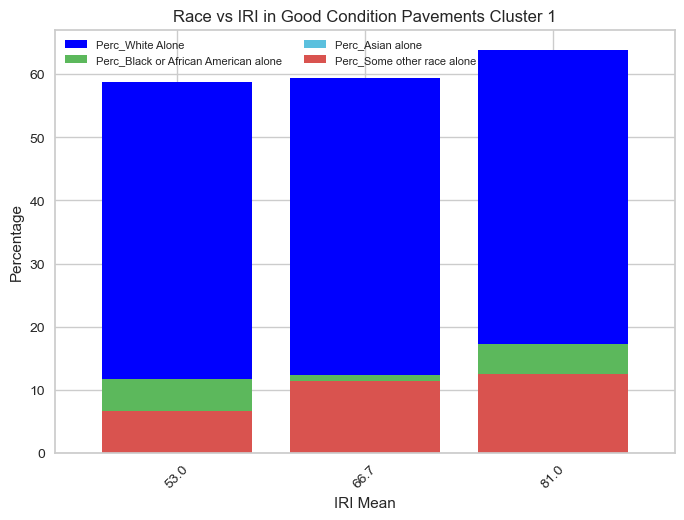

In [123]:
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 18))

# Plot the first metric
# It's important to sort the DataFrame based on 'IRI_mean' to ensure a coherent bar plot
ax = Good_Condtion_Pavements.sort_values('IRI_mean').plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone', width=0.8)

# Overlay the second metrics with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

# Ensure the DataFrame is sorted by 'IRI_mean' for each metric plotted
for metric, color in zip(second_metrics, colors):
    Good_Condtion_Pavements.sort_values('IRI_mean').plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric, width=0.8)

plt.legend(loc='upper left', fontsize=8, ncol=2)
plt.title('Race vs IRI in Good Condition Pavements Cluster 1')
plt.xlabel('IRI Mean')  # Adding an x-label for clarity
plt.ylabel('Percentage')  # Adding a y-label for clarity
plt.xticks(rotation=45)  # Rotating x-ticks for better readability

plt.savefig('Race_vs_IRI_Good_Condition_Pavements_Cluster_1.png')  # Corrected plt.savefig usage
plt.show()


<Figure size 3000x1800 with 0 Axes>

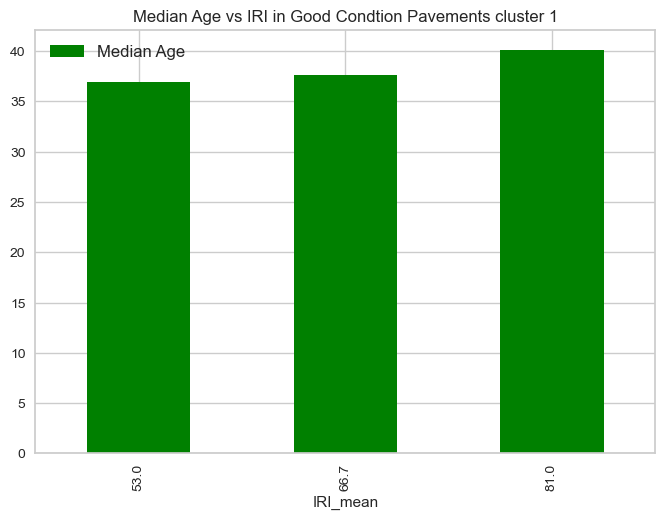

In [124]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Good Condtion Pavements cluster 1")
plt.show()

## Acceptable pavements in cluster 1

In [125]:
m_pavements = cluster_1[(cluster_1['IRI_mean'] > 95) & (cluster_1['IRI_mean'] <= 170)]
m_pavements.describe()

pd.to_numeric(m_pavements['IRI_mean'], errors='coerce')
m_pavements.round(0).head(5)

m_pavements.mean()

AADT_mean                                            2.199891e+04
Year                                                 2.018612e+03
IRI_mean                                             1.288226e+02
Urban_Code_mode                                      5.283067e+04
RHU_AV                                               6.095353e+01
TEMP_AVG                                             1.705276e+01
PRECIPITATION                                        8.841339e+02
FIPS_CODE                                            3.721944e+04
Total Population                                     2.583138e+06
Median Age                                           3.634758e+01
Employment Rate on Population 16 years and over      6.207699e+01
Unemployment Rate on Population 16 years and over    3.921569e+00
Mean income Household (dollars)                      9.002901e+04
Perc_White Alone                                     6.054484e+01
Perc_Black or African American alone                 1.488986e+01
Perc_Asian

In [126]:
Acceptable_Condtion_Pavements = m_pavements.quantile([0.25, 0.50, 0.75])
Acceptable_Condtion_Pavements= Acceptable_Condtion_Pavements.round(2)
Acceptable_Condtion_Pavements


,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,3138.0,2018.0,108.8,40429.0,34.90,16.2,250.8,32003.0,2204079.0,34.1,60.4,3.5,79424.0,58.83,11.73,5.64,6.80,1.0,0.0
0.50,10590.0,2019.0,128.0,47995.0,68.50,16.2,1015.6,32003.0,2266715.0,36.8,61.8,4.6,85925.0,59.37,12.32,7.45,11.36,1.0,0.0
0.75,27000.0,2019.0,147.2,78580.0,75.83,20.3,1154.8,48201.0,2635516.0,37.7,63.7,5.3,92488.0,63.07,19.14,10.00,12.86,1.0,0.0


<Figure size 3000x1800 with 0 Axes>

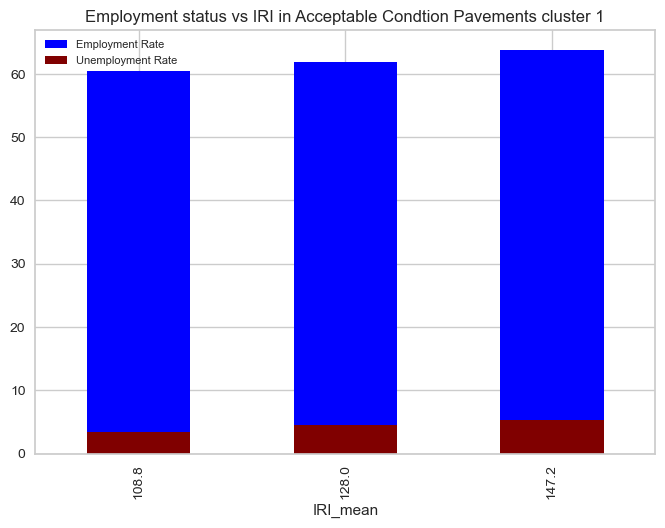

In [127]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend(loc='upper left', fontsize=8) 

plt.title("Employment status vs IRI in Acceptable Condtion Pavements cluster 1")
plt.show()

<Figure size 3000x1800 with 0 Axes>

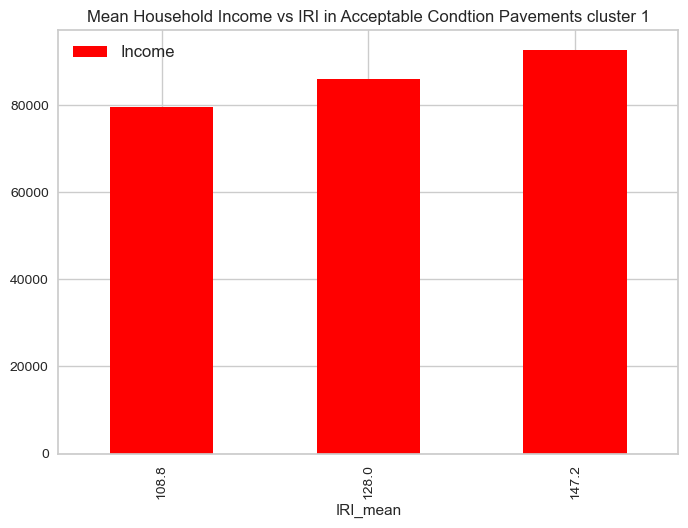

In [128]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Mean Household Income vs IRI in Acceptable Condtion Pavements cluster 1')
plt.show()

<Figure size 3000x1800 with 0 Axes>

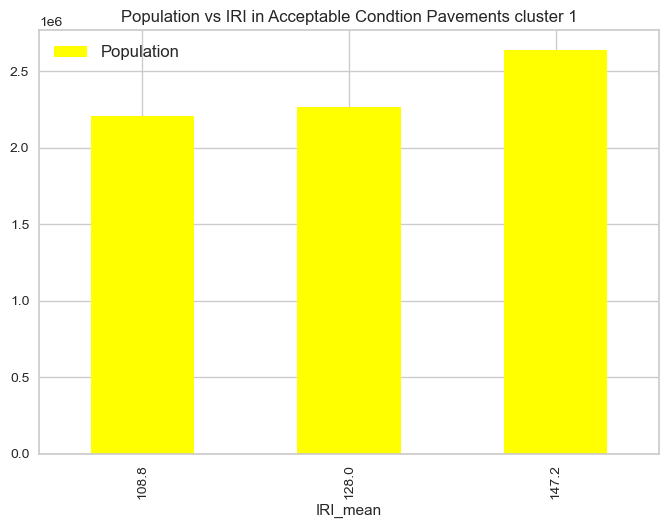

In [129]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Population vs IRI in Acceptable Condtion Pavements cluster 1')
plt.show()

<Figure size 3000x1800 with 0 Axes>

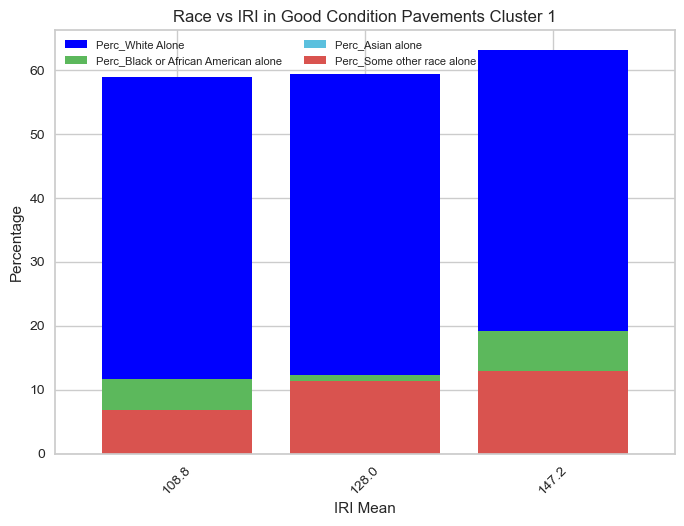

In [138]:
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 18))

# Plot the first metric
# It's important to sort the DataFrame based on 'IRI_mean' to ensure a coherent bar plot
ax = Acceptable_Condtion_Pavements.sort_values('IRI_mean').plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone', width=0.8)

# Overlay the second metrics with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

# Ensure the DataFrame is sorted by 'IRI_mean' for each metric plotted
for metric, color in zip(second_metrics, colors):
    Acceptable_Condtion_Pavements.sort_values('IRI_mean').plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric, width=0.8)

plt.legend(loc='upper left', fontsize=8, ncol=2)
plt.title('Race vs IRI in Good Condition Pavements Cluster 1')
plt.xlabel('IRI Mean')  # Adding an x-label for clarity
plt.ylabel('Percentage')  # Adding a y-label for clarity
plt.xticks(rotation=45)  # Rotating x-ticks for better readability

plt.savefig('Race_vs_IRI_Good_Condition_Pavements_Cluster_1.png')  # Corrected plt.savefig usage
plt.show()


<Figure size 3000x1800 with 0 Axes>

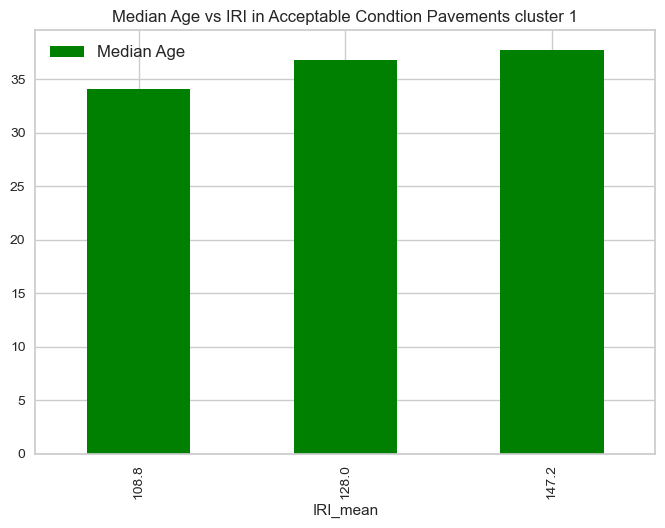

In [131]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Acceptable Condtion Pavements cluster 1")
plt.show()

## poor pavements in cluster 1

In [139]:
b_pavements = cluster_1[cluster_1['IRI_mean'] > 170]
print(b_pavements.columns)

pd.to_numeric(m_pavements['IRI_mean'], errors='coerce')
b_pavements.describe()

b_pavements.mean()

Index(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone', 'kmeans_data_cluster',
       'Hierarchical_cluster'],
      dtype='object')


AADT_mean                                            1.006383e+04
Year                                                 2.018847e+03
IRI_mean                                             2.398631e+02
Urban_Code_mode                                      4.537259e+04
RHU_AV                                               6.805252e+01
TEMP_AVG                                             1.722080e+01
PRECIPITATION                                        1.068232e+03
FIPS_CODE                                            4.348140e+04
Total Population                                     2.609319e+06
Median Age                                           3.550365e+01
Employment Rate on Population 16 years and over      6.349335e+01
Unemployment Rate on Population 16 years and over    4.337027e+00
Mean income Household (dollars)                      9.475583e+04
Perc_White Alone                                     5.969382e+01
Perc_Black or African American alone                 1.624244e+01
Perc_Asian

In [140]:
Poor_Condtion_Pavements = b_pavements.quantile([0.25, 0.50, 0.75])
Poor_Condtion_Pavements=Poor_Condtion_Pavements.round(2)
Poor_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,1517.0,2018.0,195.65,22042.0,67.6,16.2,894.70,48029.0,2054475.0,33.9,61.8,4.3,85925.0,58.83,11.73,6.46,6.80,1.0,0.0
0.50,4917.0,2019.0,228.70,40429.0,68.6,18.7,1015.89,48121.0,2252782.0,35.0,63.7,4.6,92488.0,59.96,18.30,7.03,9.27,1.0,0.0
0.75,13614.5,2020.0,271.60,78580.0,77.0,20.3,1196.00,48201.0,2635516.0,36.8,65.5,5.2,94602.0,63.07,19.42,9.84,12.86,1.0,0.0


<Figure size 3000x1800 with 0 Axes>

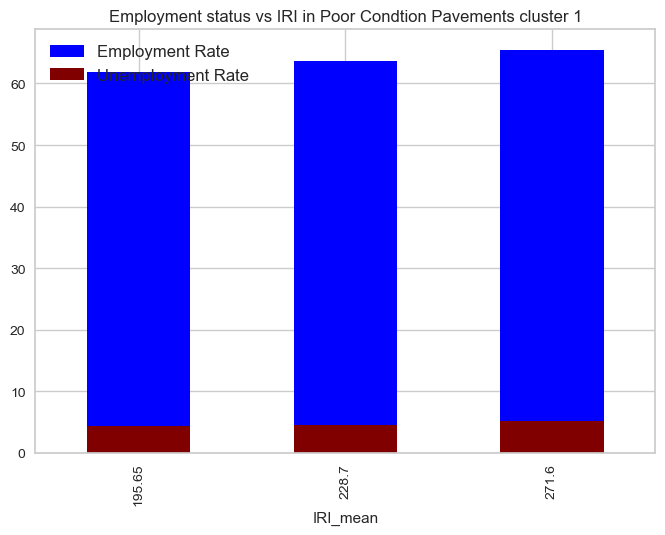

In [141]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Poor_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Employment status vs IRI in Poor Condtion Pavements cluster 1')
plt.show()

<Figure size 3000x1800 with 0 Axes>

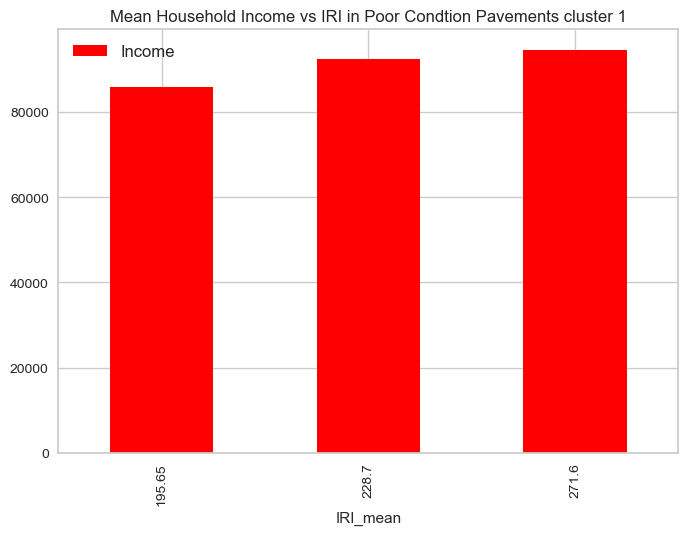

In [142]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Mean Household Income vs IRI in Poor Condtion Pavements cluster 1')
plt.show()

<Figure size 3000x1800 with 0 Axes>

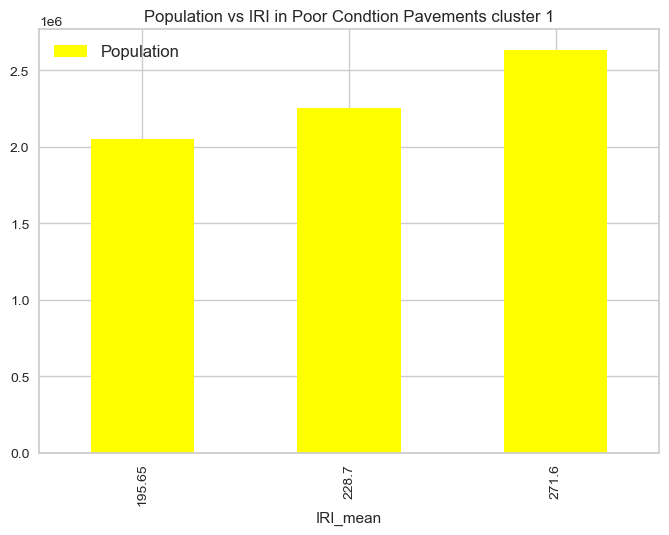

In [143]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Population vs IRI in Poor Condtion Pavements cluster 1')
plt.show()


<Figure size 3000x1800 with 0 Axes>

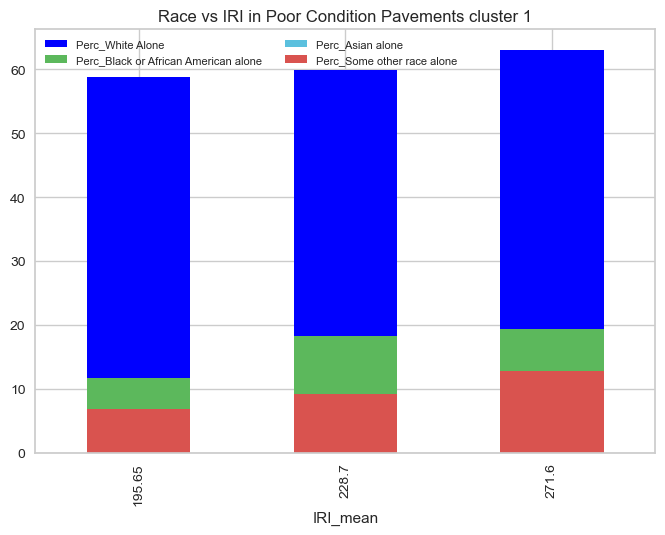

In [144]:
plt.figure(figsize=(30, 18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metrics with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

for metric, color in zip(second_metrics, colors):
    Poor_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(fontsize=8, ncol=2)
plt.title('Race vs IRI in Poor Condition Pavements cluster 1')
plt.show()

<Figure size 3000x1800 with 0 Axes>

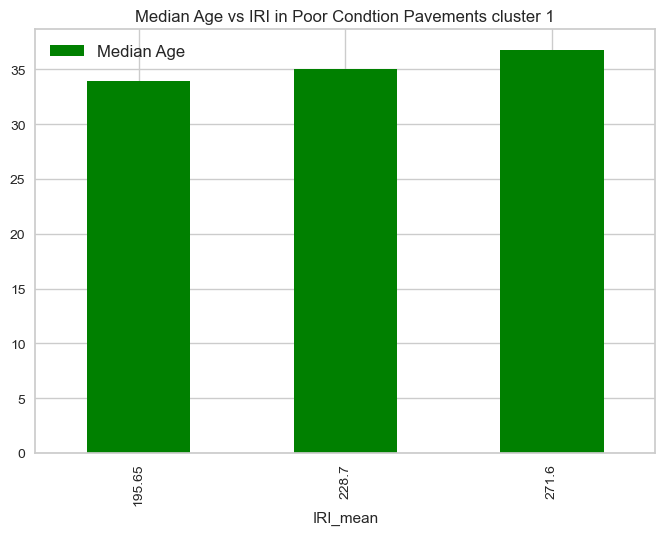

In [145]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Poor Condtion Pavements cluster 1")
plt.show()


## Good, acceptable and poor pavements in cluster 3

In [146]:
g_pavements = cluster_3[cluster_3['IRI_mean'] <= 95]
g_pavements.describe()

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4.771000e+03,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.000000,4771.0
mean,59466.001467,2018.790610,64.727224,60198.814908,72.883127,14.919205,1136.047409,31580.821002,8.745968e+05,38.677510,61.363697,3.763802,94340.799308,68.408270,14.470465,5.976468,7.015312,3.077133,2.0
std,51636.010886,1.155954,16.270164,30934.596889,9.627875,5.340262,334.913271,14091.418028,2.799725e+05,4.228668,5.290465,2.013083,20227.599837,14.270738,10.840742,5.573418,6.654925,1.349557,0.0
min,77.000000,2017.000000,30.000000,199.000000,34.916667,4.692308,240.000000,10003.000000,4.400590e+05,24.800000,49.500000,0.300000,55786.000000,16.013051,0.476082,0.989056,0.248509,2.000000,2.0
25%,18452.500000,2018.000000,51.666667,42346.000000,73.400000,10.376923,1087.200000,13135.000000,6.462660e+05,36.400000,58.000000,3.000000,79366.000000,60.820837,7.428631,2.964419,2.244921,2.000000,2.0
50%,45500.000000,2019.000000,64.400000,67105.000000,76.250000,12.800000,1216.003692,34029.000000,7.879580e+05,38.400000,62.100000,4.100000,90771.000000,71.869303,12.354083,4.200922,4.662390,2.000000,2.0
75%,89238.500000,2020.000000,77.775000,86599.000000,77.400000,20.315385,1335.200000,42071.000000,1.111761e+06,40.500000,65.000000,5.000000,105263.000000,77.921354,19.042380,7.103319,10.173715,5.000000,2.0
max,373000.000000,2020.000000,95.000000,99999.000000,84.600000,24.000000,2488.000000,55079.000000,1.584064e+06,49.300000,70.700000,10.000000,160598.000000,91.483993,62.898737,42.225941,57.934381,5.000000,2.0


In [147]:
pd.to_numeric(g_pavements['IRI_mean'], errors='coerce')
print(g_pavements.shape)

g_pavements.head(10)

(4771, 19)


,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
29,25801.0,2017,73.8,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
30,152563.0,2017,57.0,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
31,201974.0,2017,73.0,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
33,34736.0,2017,71.8,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
34,17785.0,2017,76.8,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
35,33346.0,2017,60.9,99999.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
36,33346.0,2017,81.5,99999.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
37,50198.0,2017,58.0,99999.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
38,26062.0,2017,53.0,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2
39,105258.0,2017,85.2,4384.0,67.1,19.6,933.1,48453,1226698.0,34.3,70.3,0.5,103873.0,70.622272,8.256392,6.755208,10.136725,5,2


In [148]:
g_pavements.mean()

AADT_mean                                             59466.001467
Year                                                   2018.790610
IRI_mean                                                 64.727224
Urban_Code_mode                                       60198.814908
RHU_AV                                                   72.883127
TEMP_AVG                                                 14.919205
PRECIPITATION                                          1136.047409
FIPS_CODE                                             31580.821002
Total Population                                     874596.796479
Median Age                                               38.677510
Employment Rate on Population 16 years and over          61.363697
Unemployment Rate on Population 16 years and over         3.763802
Mean income Household (dollars)                       94340.799308
Perc_White Alone                                         68.408270
Perc_Black or African American alone                     14.47

In [149]:
Good_Condtion_Pavements = g_pavements.quantile([0.25, 0.50, 0.75])
Good_Condtion_Pavements = Good_Condtion_Pavements.round(2)
Good_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,18452.5,2018.0,51.67,42346.0,73.40,10.38,1087.2,13135.0,646266.0,36.4,58.0,3.0,79366.0,60.82,7.43,2.96,2.24,2.0,2.0
0.50,45500.0,2019.0,64.40,67105.0,76.25,12.80,1216.0,34029.0,787958.0,38.4,62.1,4.1,90771.0,71.87,12.35,4.20,4.66,2.0,2.0
0.75,89238.5,2020.0,77.78,86599.0,77.40,20.32,1335.2,42071.0,1111761.0,40.5,65.0,5.0,105263.0,77.92,19.04,7.10,10.17,5.0,2.0


<Figure size 3000x1800 with 0 Axes>

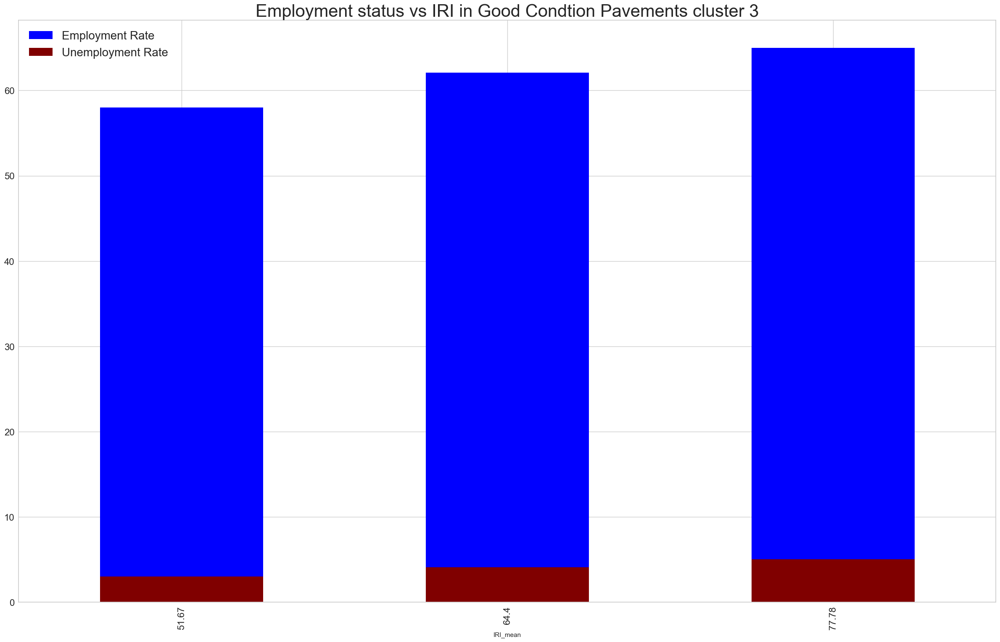

In [150]:
import matplotlib.pyplot as plt

# Assuming 'Good_Pavements' is your DataFrame

# Set the figure size first
plt.figure(figsize=(30, 18))

# Plot the first metric
ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate', figsize=(30,18), fontsize=16)

# Overlay the second metric
Good_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate', fontsize=16)

# Legend and Title
plt.legend(loc='upper left', fontsize=20) 
plt.title("Employment status vs IRI in Good Condtion Pavements cluster 3", fontsize=30)

# Display the plot
plt.show()

<Figure size 3000x1800 with 0 Axes>

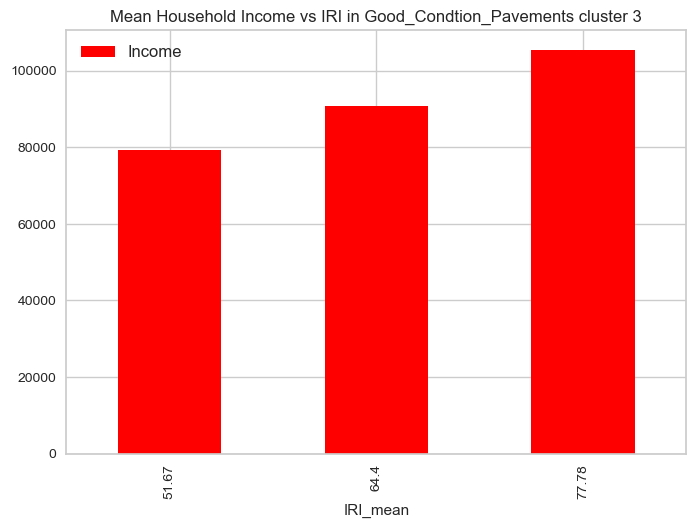

In [151]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Mean Household Income vs IRI in Good_Condtion_Pavements cluster 3")
plt.show()

<Figure size 3000x1800 with 0 Axes>

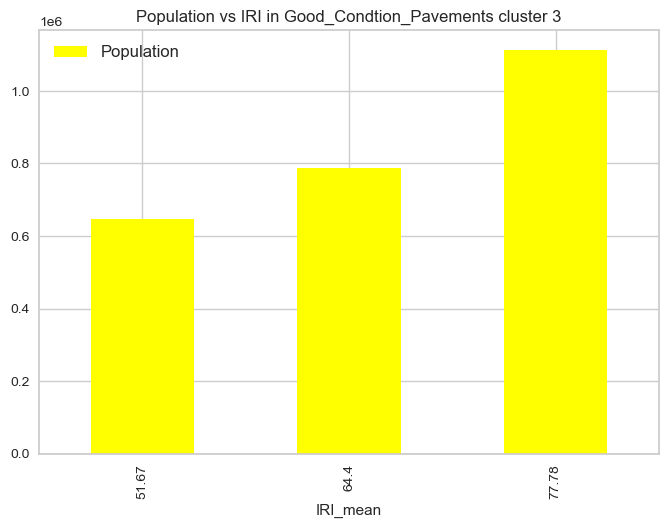

In [152]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Population vs IRI in Good_Condtion_Pavements cluster 3")
plt.show()

<Figure size 3000x1800 with 0 Axes>

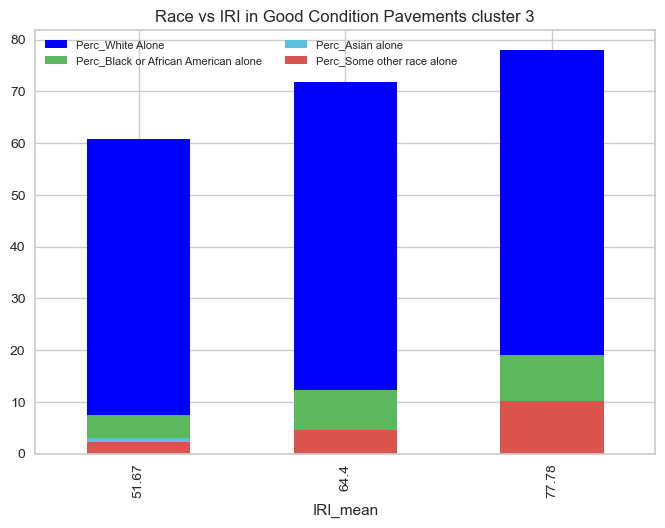

In [153]:
plt.figure(figsize=(30, 18))

# Plot the first metric
ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metrics with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

for metric, color in zip(second_metrics, colors):
    Good_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(loc='upper left', fontsize=8, ncol=2)

plt.title('Race vs IRI in Good Condition Pavements cluster 3')


plt.show()

<Figure size 3000x1800 with 0 Axes>

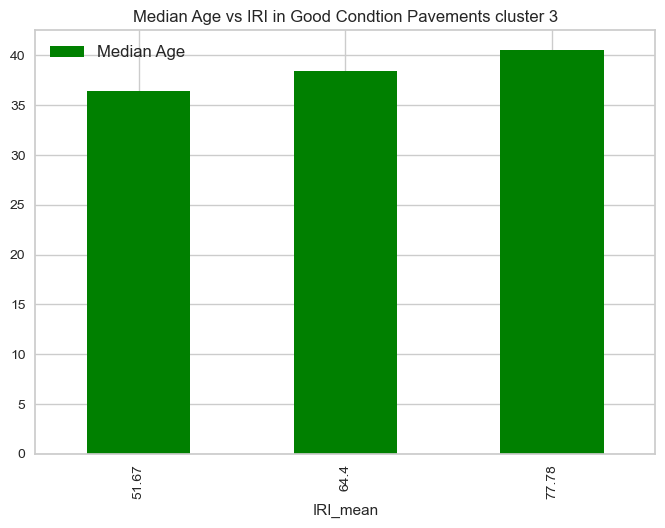

In [154]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Good_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Good Condtion Pavements cluster 3")
plt.show()

## acceptable pavements in cluster 3

In [155]:
m_pavements = cluster_3[(cluster_3['IRI_mean'] > 95) & (cluster_1['IRI_mean'] <= 170)]
m_pavements.describe()

C:\Users\tadnan\AppData\Local\Temp\ipykernel_14140\3241869354.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [156]:
pd.to_numeric(m_pavements['IRI_mean'], errors='coerce')
m_pavements.round(0).head(5)

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster


In [157]:
m_pavements.mean()

AADT_mean                                           NaN
Year                                                NaN
IRI_mean                                            NaN
Urban_Code_mode                                     NaN
RHU_AV                                              NaN
TEMP_AVG                                            NaN
PRECIPITATION                                       NaN
FIPS_CODE                                           NaN
Total Population                                    NaN
Median Age                                          NaN
Employment Rate on Population 16 years and over     NaN
Unemployment Rate on Population 16 years and over   NaN
Mean income Household (dollars)                     NaN
Perc_White Alone                                    NaN
Perc_Black or African American alone                NaN
Perc_Asian alone                                    NaN
Perc_Some other race alone                          NaN
kmeans_data_cluster                             

In [158]:
Acceptable_Condtion_Pavements = m_pavements.quantile([0.25, 0.50, 0.75])
Acceptable_Condtion_Pavements= Acceptable_Condtion_Pavements.round(2)
Acceptable_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Figure size 3000x1800 with 0 Axes>

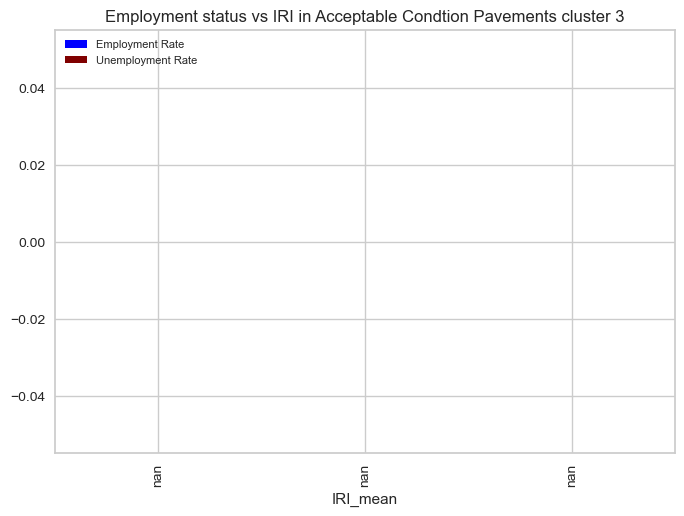

In [159]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend(loc='upper left', fontsize=8) 

plt.title("Employment status vs IRI in Acceptable Condtion Pavements cluster 3")
plt.show()

<Figure size 3000x1800 with 0 Axes>

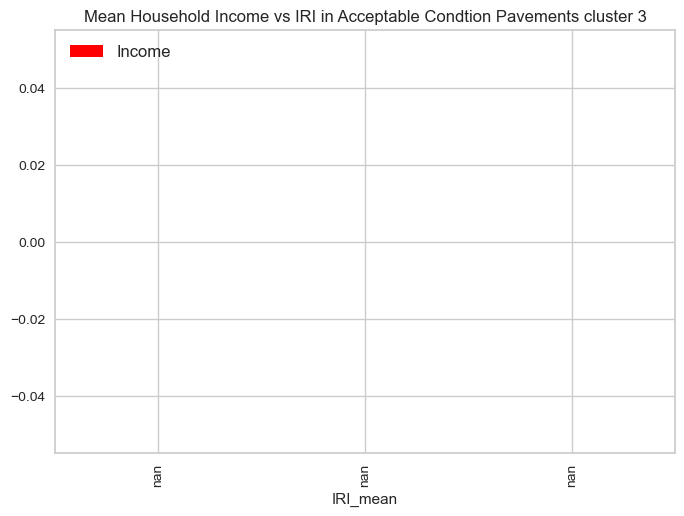

In [160]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Mean Household Income vs IRI in Acceptable Condtion Pavements cluster 3')
plt.show()

<Figure size 3000x1800 with 0 Axes>

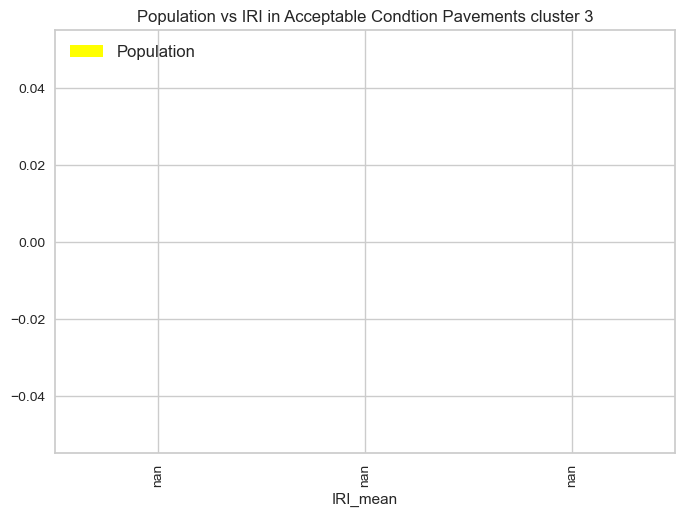

In [161]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Population vs IRI in Acceptable Condtion Pavements cluster 3')
plt.show()

<Figure size 6000x3000 with 0 Axes>

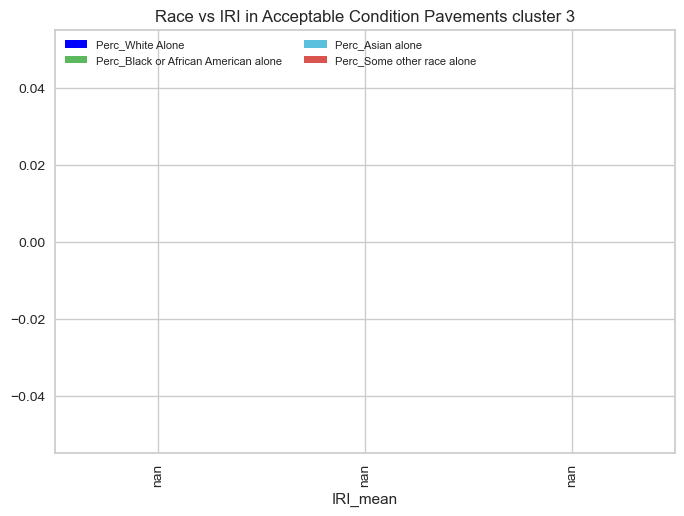

In [162]:

plt.figure(figsize=(60, 30))

# Plot the first metric. Assuming 'Acceptable_Condtion_Pavements' is your DataFrame.
ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metrics with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f']  # Add more colors if needed
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

for metric, color in zip(second_metrics, colors):
    Acceptable_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(loc='upper left', fontsize=8, ncol=2)

plt.title('Race vs IRI in Acceptable Condition Pavements cluster 3')
plt.show()

<Figure size 3000x1800 with 0 Axes>

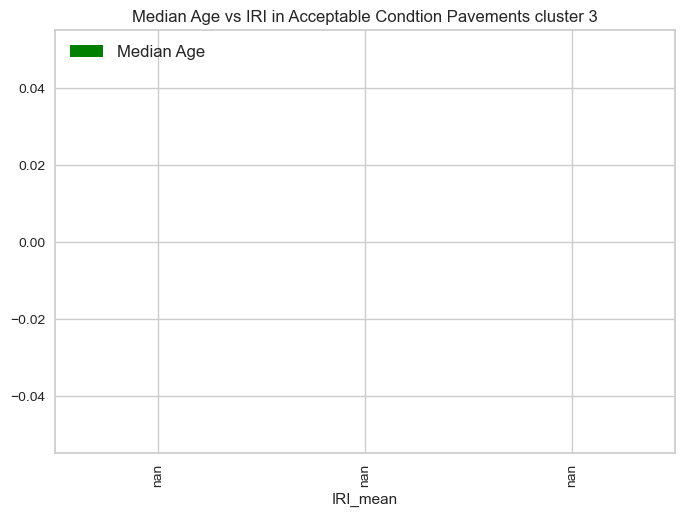

In [163]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Acceptable_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Acceptable Condtion Pavements cluster 3")

plt.show()

## poor pavements in cluster 3

In [164]:
b_pavements = cluster_2[cluster_2['IRI_mean'] > 170]
print(b_pavements.columns)

Index(['AADT_mean', 'Year', 'IRI_mean', 'Urban_Code_mode', 'RHU_AV',
       'TEMP_AVG', 'PRECIPITATION', 'FIPS_CODE', 'Total Population',
       'Median Age', 'Employment Rate on Population 16 years and over',
       'Unemployment Rate on Population 16 years and over',
       'Mean income Household (dollars)', 'Perc_White Alone',
       'Perc_Black or African American alone', 'Perc_Asian alone',
       'Perc_Some other race alone', 'kmeans_data_cluster',
       'Hierarchical_cluster'],
      dtype='object')


In [165]:
pd.to_numeric(m_pavements['IRI_mean'], errors='coerce')
b_pavements.describe()

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
count,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.00000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.000000,9319.0
mean,7795.817040,2018.702221,233.726318,58180.065672,71.500572,13.489246,1068.841851,37647.683013,243560.886576,38.12482,58.699369,4.264365,79765.209196,74.630313,10.487241,3.385693,4.688163,1.400579,1.0
std,10279.564537,1.066005,57.699816,32091.321349,10.265288,5.173334,393.019409,11875.030941,136307.830493,4.20198,5.031906,2.076514,15018.822767,16.875863,12.893891,4.855351,6.110694,1.907038,0.0
min,23.000000,2017.000000,170.100000,199.000000,35.666667,0.469231,239.966615,10001.000000,62607.000000,25.00000,36.100000,0.500000,47034.000000,11.705690,0.079000,0.000000,0.000000,0.000000,1.0
25%,1500.000000,2018.000000,190.000000,32194.000000,69.700000,9.600000,846.300000,28049.000000,132230.000000,35.20000,55.800000,2.900000,69125.000000,67.894992,2.277963,1.157810,1.050204,0.000000,1.0
50%,4174.000000,2019.000000,217.000000,58168.000000,74.800000,12.384615,1135.418405,40017.000000,206650.000000,38.20000,58.629330,4.200000,77305.000000,78.844820,5.789264,2.233876,2.305103,0.000000,1.0
75%,10398.000000,2020.000000,262.000000,87193.000000,77.200000,17.900000,1323.900000,48187.000000,326120.000000,41.00000,62.000000,5.400000,89263.500000,87.300071,13.717831,3.852094,5.751341,4.000000,1.0
max,215172.000000,2020.000000,615.000000,99999.000000,87.600000,24.800000,3145.300000,56025.000000,611648.000000,60.20000,76.100000,13.800000,158886.000000,96.406437,73.153089,33.715498,42.104133,4.000000,1.0


In [166]:
b_pavements.mean()

AADT_mean                                              7795.817040
Year                                                   2018.702221
IRI_mean                                                233.726318
Urban_Code_mode                                       58180.065672
RHU_AV                                                   71.500572
TEMP_AVG                                                 13.489246
PRECIPITATION                                          1068.841851
FIPS_CODE                                             37647.683013
Total Population                                     243560.886576
Median Age                                               38.124820
Employment Rate on Population 16 years and over          58.699369
Unemployment Rate on Population 16 years and over         4.264365
Mean income Household (dollars)                       79765.209196
Perc_White Alone                                         74.630313
Perc_Black or African American alone                     10.48

In [167]:
Poor_Condtion_Pavements = b_pavements.quantile([0.25, 0.50, 0.75])
Poor_Condtion_Pavements=Poor_Condtion_Pavements.round(2)
Poor_Condtion_Pavements

,AADT_mean,Year,IRI_mean,Urban_Code_mode,RHU_AV,TEMP_AVG,PRECIPITATION,FIPS_CODE,Total Population,Median Age,Employment Rate on Population 16 years and over,Unemployment Rate on Population 16 years and over,Mean income Household (dollars),Perc_White Alone,Perc_Black or African American alone,Perc_Asian alone,Perc_Some other race alone,kmeans_data_cluster,Hierarchical_cluster
0.25,1500.0,2018.0,190.0,32194.0,69.7,9.60,846.30,28049.0,132230.0,35.2,55.80,2.9,69125.0,67.89,2.28,1.16,1.05,0.0,1.0
0.50,4174.0,2019.0,217.0,58168.0,74.8,12.38,1135.42,40017.0,206650.0,38.2,58.63,4.2,77305.0,78.84,5.79,2.23,2.31,0.0,1.0
0.75,10398.0,2020.0,262.0,87193.0,77.2,17.90,1323.90,48187.0,326120.0,41.0,62.00,5.4,89263.5,87.30,13.72,3.85,5.75,4.0,1.0


<Figure size 3000x1800 with 0 Axes>

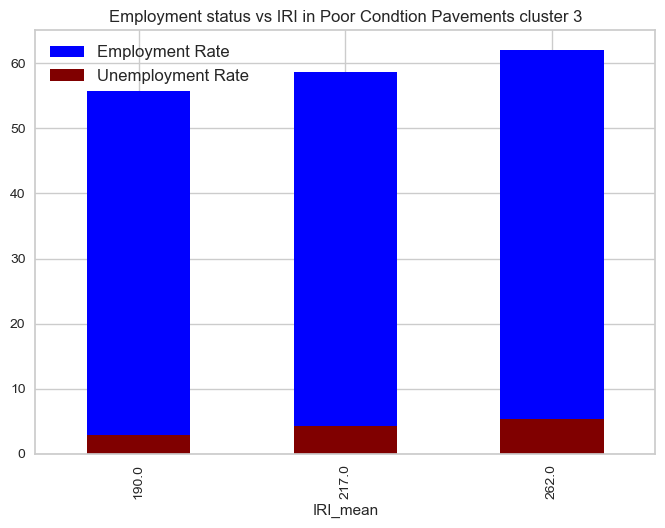

In [168]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Employment Rate on Population 16 years and over', kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Poor_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Employment status vs IRI in Poor Condtion Pavements cluster 3')
plt.show()

<Figure size 3000x1800 with 0 Axes>

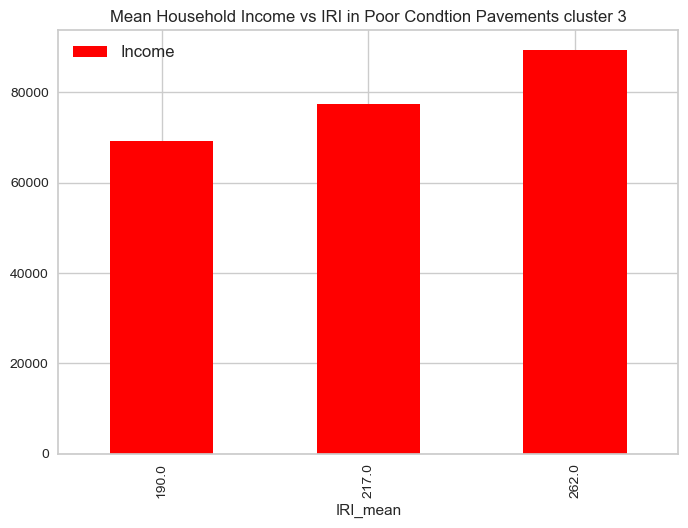

In [169]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Mean income Household (dollars)', kind='bar', color='Red', label='Income')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Mean Household Income vs IRI in Poor Condtion Pavements cluster 3')
plt.show()

<Figure size 3000x1800 with 0 Axes>

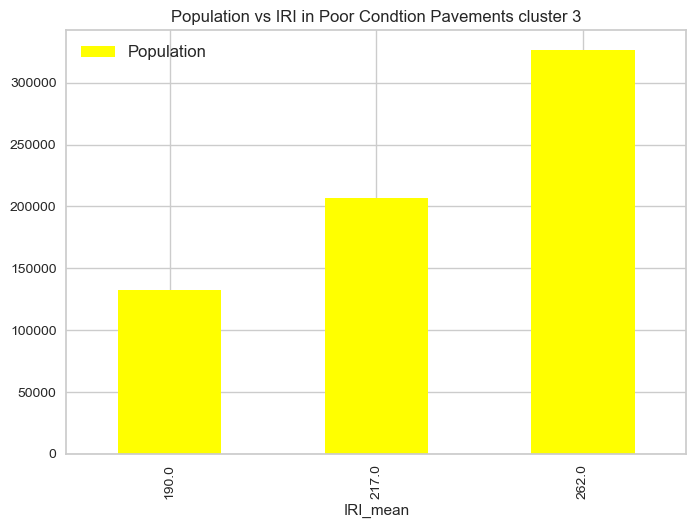

In [170]:
plt.figure(figsize=(30,18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Total Population', kind='bar', color='Yellow', label='Population')

plt.legend(loc='upper left', fontsize=12) 

plt.title('Population vs IRI in Poor Condtion Pavements cluster 3')
plt.show()

<Figure size 3000x1800 with 0 Axes>

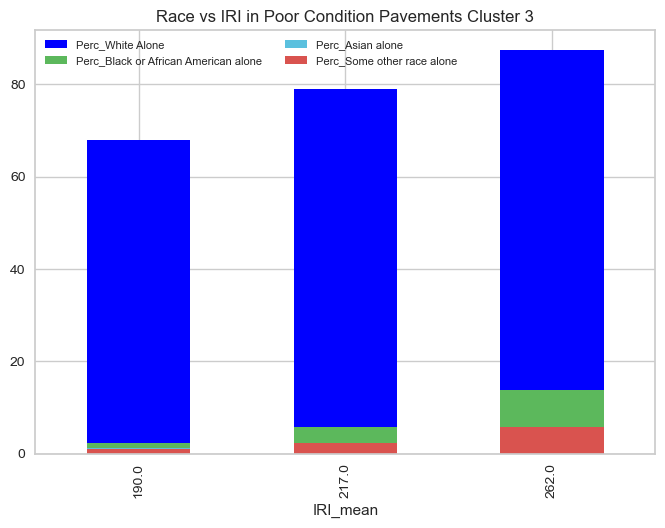

In [171]:
plt.figure(figsize=(30, 18))

# Plot the first metric
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Perc_White Alone', kind='bar', color='blue', label='Perc_White Alone')

# Overlay the second metrics with corrected labels
colors = ['#5cb85c', '#5bc0de', '#d9534f']  # Corrected the syntax error in the colors list
second_metrics = ['Perc_Black or African American alone', 'Perc_Asian alone', 'Perc_Some other race alone']

for metric, color in zip(second_metrics, colors):
    Poor_Condtion_Pavements.plot(x='IRI_mean', y=metric, kind='bar', ax=ax, color=color, label=metric)

plt.legend(fontsize=8, ncol=2)
plt.title('Race vs IRI in Poor Condition Pavements Cluster 3')
plt.show()

<Figure size 3000x1800 with 0 Axes>

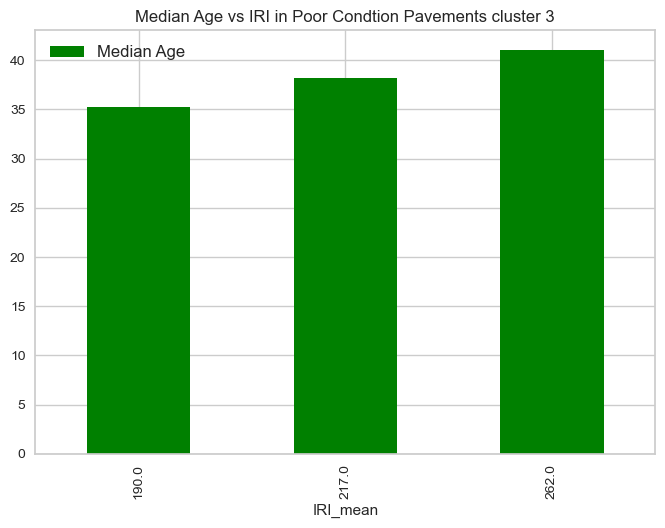

In [172]:
# Plot the first metric
plt.figure(figsize=(30,18))

ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y='Median Age', kind='bar', color='Green', label='Median Age')

plt.legend(loc='upper left', fontsize=12) 

plt.title("Median Age vs IRI in Poor Condtion Pavements cluster 3")
plt.show()


# Make a new Dataframe

In [176]:
ax = Poor_Condtion_Pavements.plot(x='IRI_mean', y=['Employment Rate on Population 16 years and over','Unemployment Rate on Population 16 years and over'], kind='bar', color='blue', label='Employment Rate')

# Overlay the second metric
Bad_Condtion_Pavements.plot(x='IRI_mean', y='Unemployment Rate on Population 16 years and over', kind='bar', ax=ax, color='maroon', label='Unemployment Rate')

plt.legend()
plt.figure(figsize=(30,18))

plt.show()


ValueError: label should be list-like and same length as y

In [177]:
# Drop rows by row number
df = Poor_Condtion_Pavements.drop(df.index[[1, 18, 19]])

NameError: name 'df' is not defined

IndexError: single positional indexer is out-of-bounds

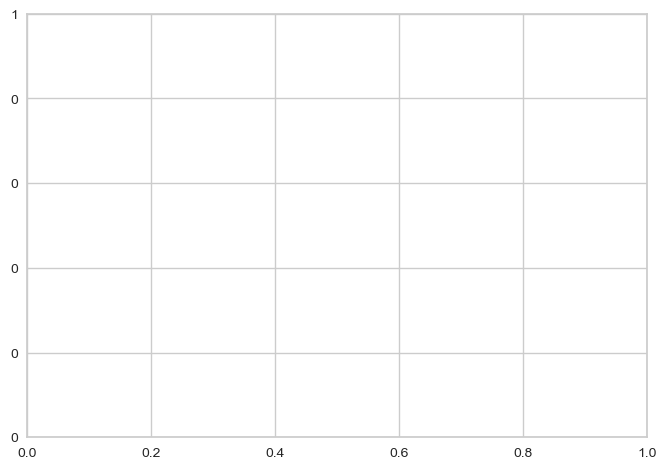

In [178]:
# Format the y-axis labels to display numbers in standard notation
plt.gca().get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

Poor_Condtion_Pavements.iloc[10].plot(kind='bar', width=0.8, stacked = True, legend=True, fontsize=14, figsize=(20, 8))

IndexError: index 0 is out of bounds for axis 0 with size 0

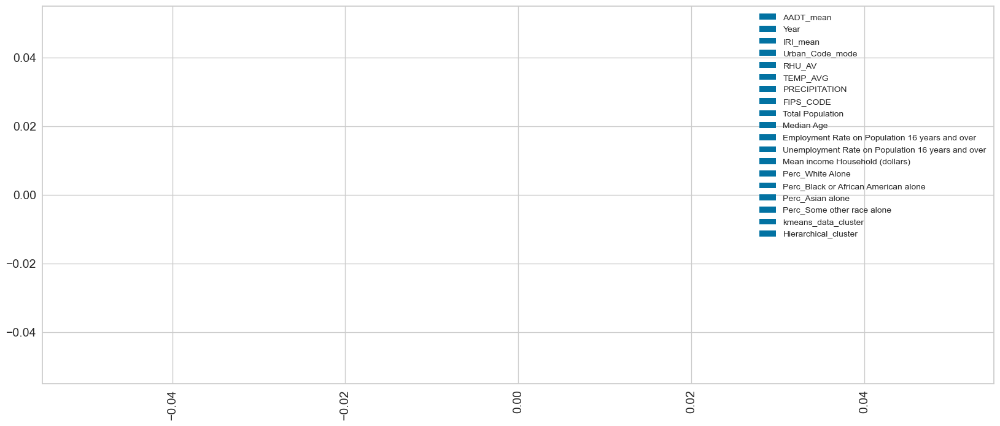

In [179]:
Poor_Condtion_Pavements.iloc[12:13].plot(kind='bar', width=0.8, stacked = True, legend=True, fontsize=14, figsize=(20, 8))

In [180]:
df.iloc[14:18].plot(kind='bar', width=0.8, stacked = True, legend=True, fontsize=14, figsize=(20, 8))

NameError: name 'df' is not defined